<a href="https://colab.research.google.com/github/wxnx/Data_Program/blob/main/Feature_Extraction.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

**Import Library**

In [1]:
import warnings
warnings.filterwarnings('ignore')

In [2]:
import librosa
import IPython.display as ipd
import matplotlib
import matplotlib.pyplot as plt
import librosa.display
import numpy as np
import pywt
import csv
import os
import pandas as pd
import sklearn
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.model_selection import train_test_split

**Import Dataset from Google Drive**

In [3]:
from google.colab import drive
drive.mount("/content/gdrive")

Mounted at /content/gdrive


In [4]:
!ls "/content/gdrive/My Drive/Dataset_TA_testing"

AS  MR	MS  MVP  N


**Check directories**

In [5]:
from glob import glob

#directories audio abnormal
data_AS = '/content/gdrive/My Drive/Dataset_TA_testing/AS/'
audio_files_AS = glob(data_AS  + '*.wav')

data_MR = '/content/gdrive/My Drive/Dataset_TA_testing/MR/'
audio_files_MR = glob(data_MR  + '*.wav')

data_MS = '/content/gdrive/My Drive/Dataset_TA_testing/MS/'
audio_files_MS = glob(data_MS  + '*.wav')

data_MVP = '/content/gdrive/My Drive/Dataset_TA_testing/MVP/'
audio_files_MVP = glob(data_MVP  + '*.wav')

#directories of normal audios
data_N = '/content/gdrive/My Drive/Dataset_TA_testing/AS/'
audio_files_N = glob(data_N  + '*.wav')

print(f'Number of AS audios : {len(audio_files_AS)}')
print(f'Number of MR audios : {len(audio_files_MR)}')
print(f'Number of MS audios : {len(audio_files_MS)}')
print(f'Number of MVP audios : {len(audio_files_MVP)}')
print(f'Number of N audios : {len(audio_files_N)}')

Number of AS audios : 200
Number of MR audios : 200
Number of MS audios : 200
Number of MVP audios : 200
Number of N audios : 200


#**Visualize all audio file**

##**Signal AS**

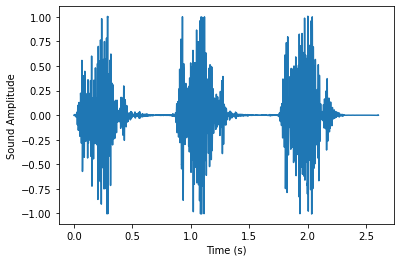

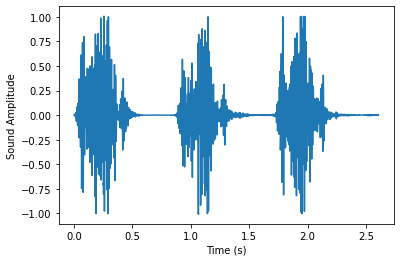

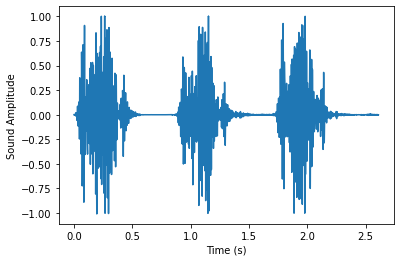

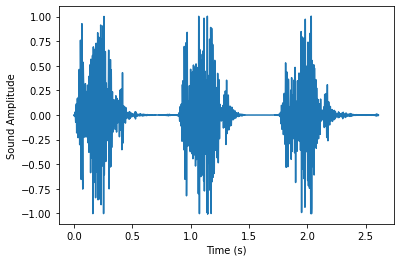

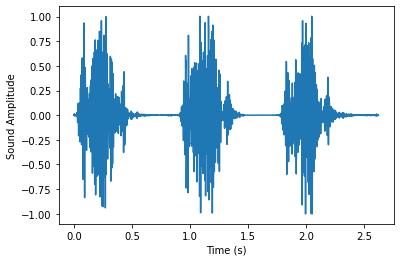

...

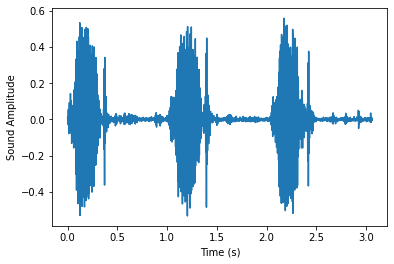

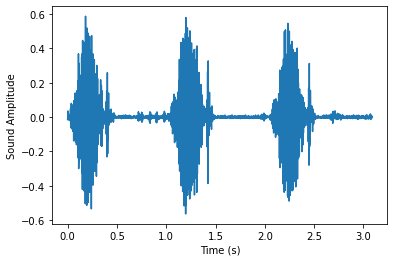

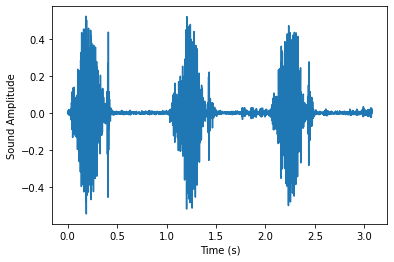

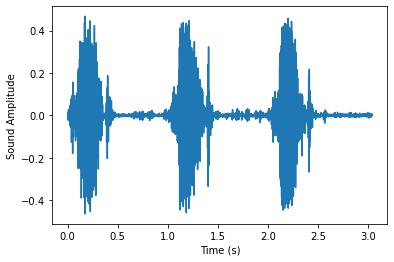

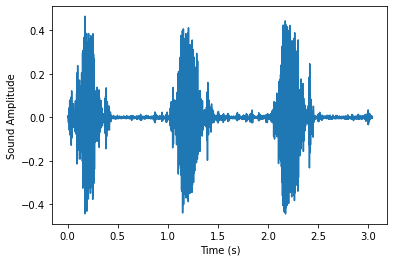

In [ ]:
for file in range(0, len(audio_files_AS),1):

  audio, sfreq = librosa.load(audio_files_AS[file])
  time = np.arange(0,len(audio)) / sfreq

  fig, ax = plt.subplots()
  ax.plot(time, audio)
  ax.set(xlabel='Time (s)', ylabel='Sound Amplitude')
  plt.show()

##**SIgnal MR**

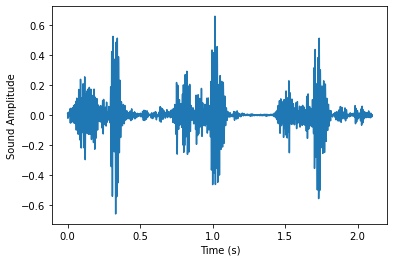

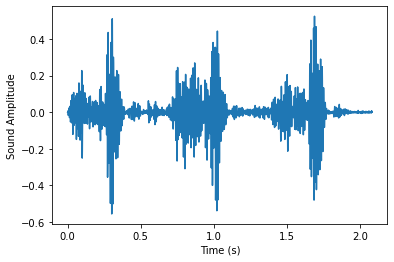

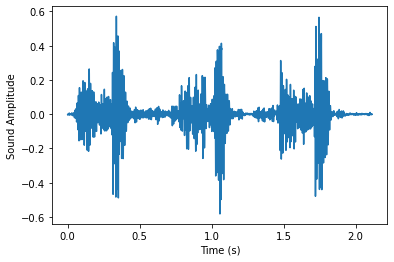

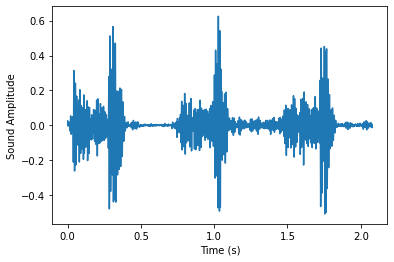

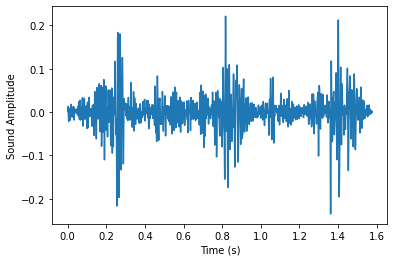

...

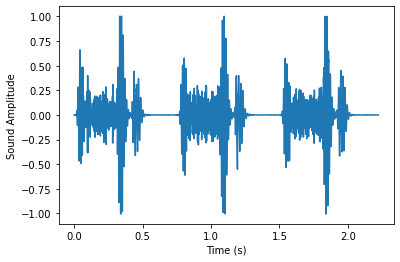

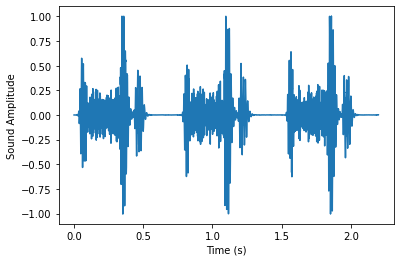

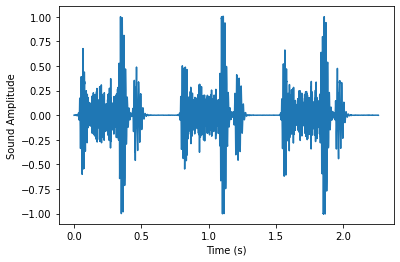

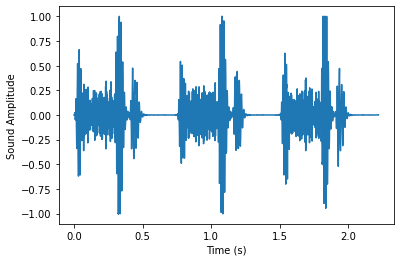

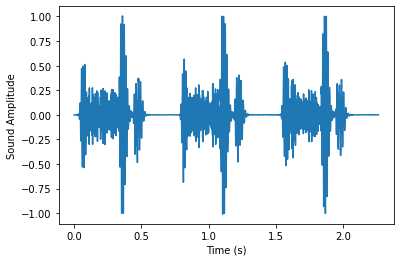

In [ ]:
for file in range(0, len(audio_files_MR),1):

  audio, sfreq = librosa.load(audio_files_MR[file])
  time = np.arange(0,len(audio)) / sfreq

  fig, ax = plt.subplots()
  ax.plot(time, audio)
  ax.set(xlabel='Time (s)', ylabel='Sound Amplitude')
  plt.show()

##**Signal MS**

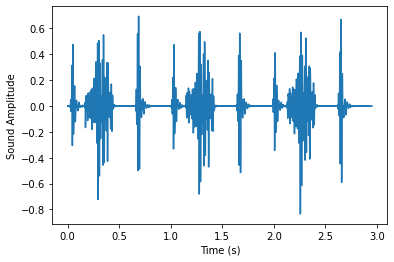

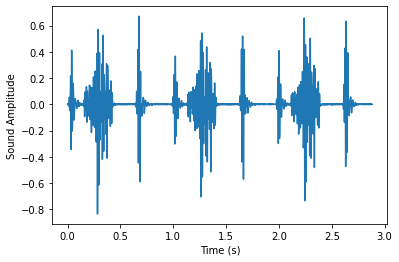

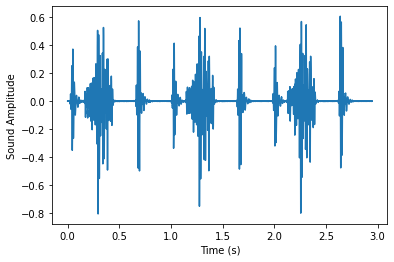

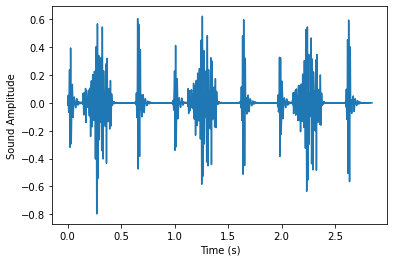

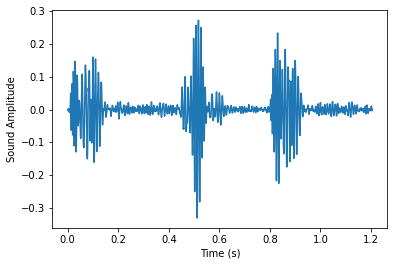

...

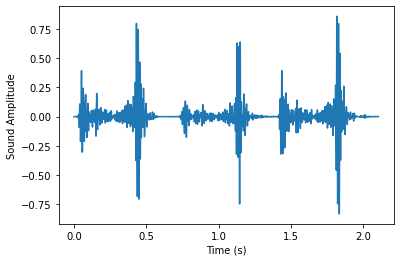

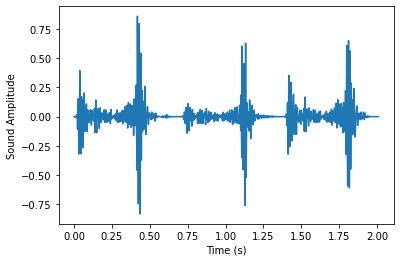

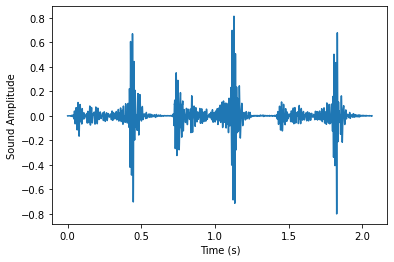

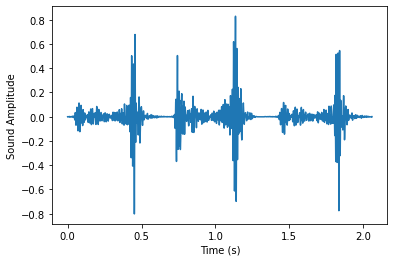

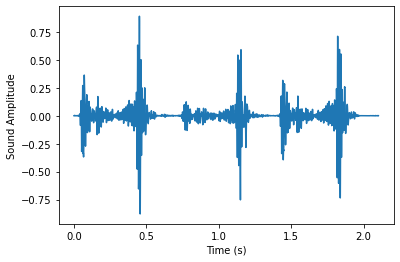

In [ ]:
for file in range(0, len(audio_files_MS),1):

  audio, sfreq = librosa.load(audio_files_MS[file])
  time = np.arange(0,len(audio)) / sfreq

  fig, ax = plt.subplots()
  ax.plot(time, audio)
  ax.set(xlabel='Time (s)', ylabel='Sound Amplitude')
  plt.show()

##**Signal MVP**

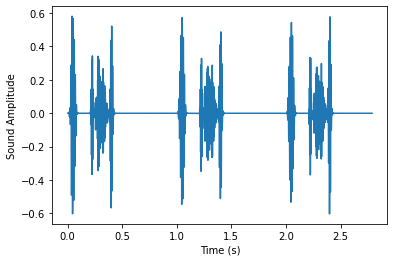

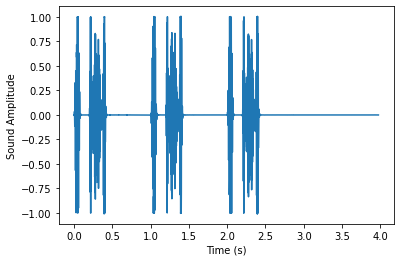

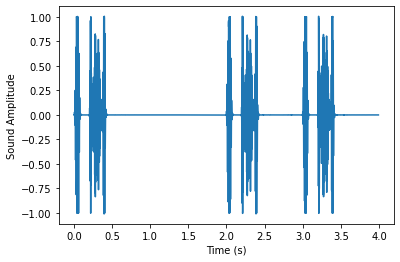

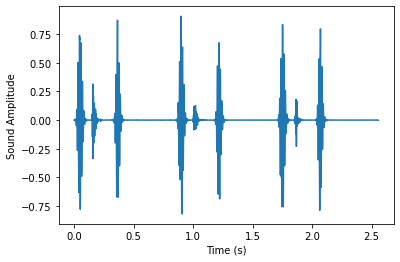

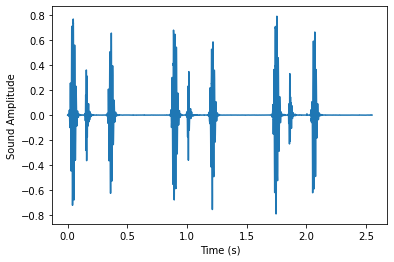

...

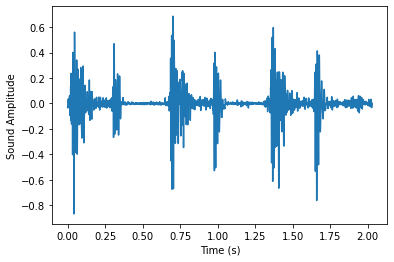

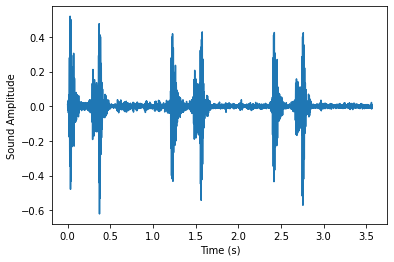

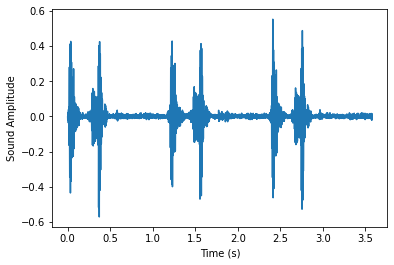

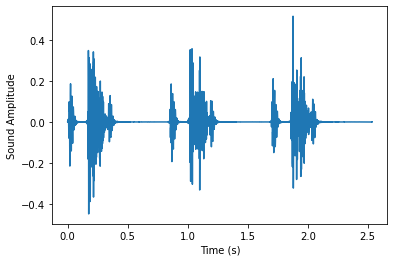

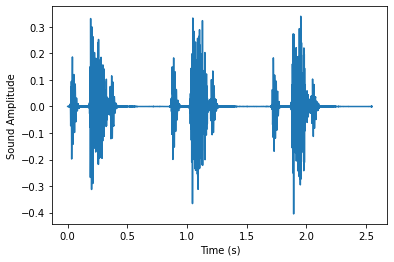

In [ ]:
for file in range(0, len(audio_files_MVP),1):

  audio, sfreq = librosa.load(audio_files_MVP[file])
  time = np.arange(0,len(audio)) / sfreq

  fig, ax = plt.subplots()
  ax.plot(time, audio)
  ax.set(xlabel='Time (s)', ylabel='Sound Amplitude')
  plt.show()

##**Signal N**

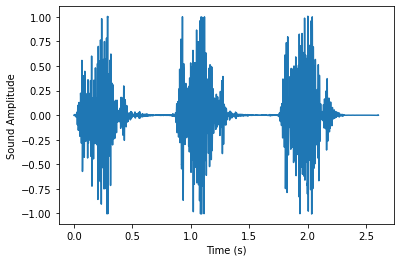

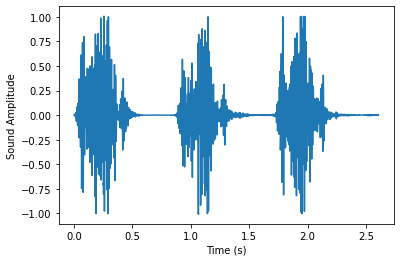

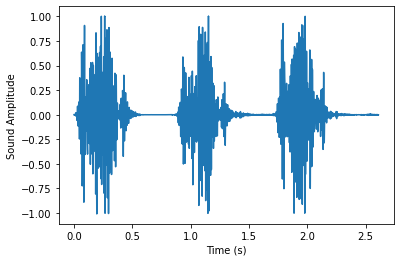

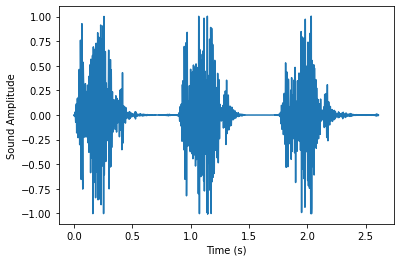

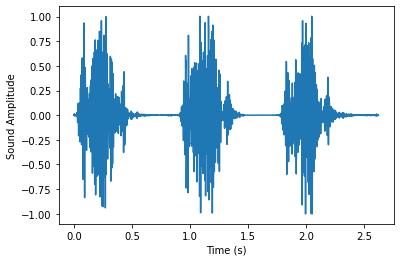

...

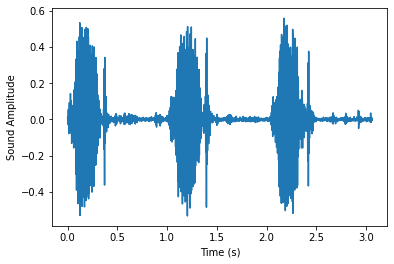

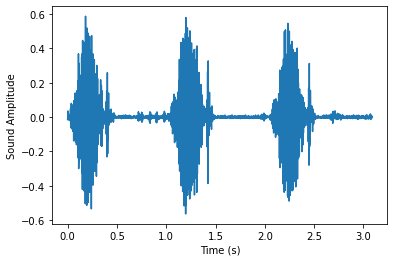

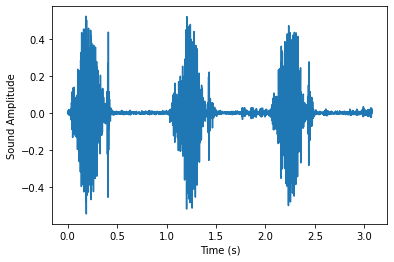

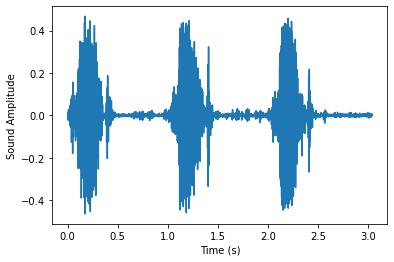

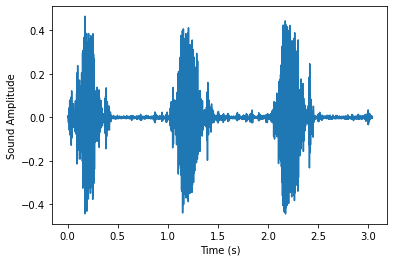

In [ ]:
for file in range(0, len(audio_files_N),1):

  audio, sfreq = librosa.load(audio_files_N[file])
  time = np.arange(0,len(audio)) / sfreq

  fig, ax = plt.subplots()
  ax.plot(time, audio)
  ax.set(xlabel='Time (s)', ylabel='Sound Amplitude')
  plt.show()

#**Load random audio file from Dataset**

In [6]:
pathAS="/content/gdrive/My Drive/Dataset_TA_testing/AS/New_AS_001.wav"
pathMR="/content/gdrive/My Drive/Dataset_TA_testing/MR/New_MR_001.wav"
pathMS="/content/gdrive/My Drive/Dataset_TA_testing/MS/New_MS_001.wav"
pathMVP="/content/gdrive/My Drive/Dataset_TA_testing/MVP/New_MVP_021.wav"
pathN="/content/gdrive/My Drive/Dataset_TA_testing/N/New_N_035.wav"
sinyalAS, srAS=librosa.load(pathAS)
sinyalMR, srMR=librosa.load(pathMR)
sinyalMS, srMS=librosa.load(pathMS)
sinyalMVP, srMVP=librosa.load(pathMVP)
sinyalN, srN=librosa.load(pathN)
print(type(sinyalAS), type(srAS))
print(type(sinyalMR), type(srMR))
print(type(sinyalMS), type(srMS))
print(type(sinyalMVP), type(srMVP))
print(type(sinyalN), type(srN))

<class 'numpy.ndarray'> <class 'int'>
<class 'numpy.ndarray'> <class 'int'>
<class 'numpy.ndarray'> <class 'int'>
<class 'numpy.ndarray'> <class 'int'>
<class 'numpy.ndarray'> <class 'int'>


##**Playing an audio file**

In [ ]:
print("Signal Aortic valve Stenosis (AS)")
ipd.Audio(pathAS)

Signal Aortic valve Stenosis (AS)


In [ ]:
print("Signal Mitral valve Regurgitation (MR)")
ipd.Audio(pathMR)

Signal Mitral valve Regurgitation (MR)


In [ ]:
print("Signal  Mitral valve Stenosis (MS)")
ipd.Audio(pathMS)

Signal  Mitral valve Stenosis (MS)


In [ ]:
print("Signal Murmur in systole (MVP)")
ipd.Audio(pathMVP)

Signal Murmur in systole (MVP)


In [ ]:
print("Signal Normal (N)")
ipd.Audio(pathN)

Signal Normal (N)


In [ ]:
sinyalAS.size, sinyalMR.size, sinyalMS.size, sinyalMVP.size, sinyalN.size

(57559, 34740, 29021, 56234, 46124)

##**Load use wave**

In [7]:
# Load use wave 
import wave
wav1 = wave.open(pathAS)
print("Signal Aortic valve Stenosis (AS)")
print("Sampling (frame) rate = ", wav1.getframerate())
print("Total samples (frames) = ", wav1.getnframes())
print("Duration = ", wav1.getnframes()/wav1.getframerate())
print("----------------------------------")
wav2 = wave.open(pathMR)
print("Signal Mitral valve Regurgitation (MR)")
print("Sampling (frame) rate = ", wav2.getframerate())
print("Total samples (frames) = ", wav2.getnframes())
print("Duration = ", wav2.getnframes()/wav2.getframerate())
print("----------------------------------")
wav3 = wave.open(pathMS)
print("Signal  Mitral valve Stenosis (MS)")
print("Sampling (frame) rate = ", wav3.getframerate())
print("Total samples (frames) = ", wav3.getnframes())
print("Duration = ", wav3.getnframes()/wav3.getframerate())
print("----------------------------------")
wav4 = wave.open(pathMVP)
print("Signal Murmur in systole (MVP)")
print("Sampling (frame) rate = ", wav4.getframerate())
print("Total samples (frames) = ", wav4.getnframes())
print("Duration = ", wav4.getnframes()/wav4.getframerate())
print("----------------------------------")
wav5 = wave.open(pathN)
print("Signal Normal (N)")
print("Sampling (frame) rate = ", wav5.getframerate())
print("Total samples (frames) = ", wav5.getnframes())
print("Duration = ", wav5.getnframes()/wav5.getframerate())

Signal Aortic valve Stenosis (AS)
Sampling (frame) rate =  8000
Total samples (frames) =  20849
Duration =  2.606125
----------------------------------
Signal Mitral valve Regurgitation (MR)
Sampling (frame) rate =  8000
Total samples (frames) =  16795
Duration =  2.099375
----------------------------------
Signal  Mitral valve Stenosis (MS)
Sampling (frame) rate =  8000
Total samples (frames) =  23626
Duration =  2.95325
----------------------------------
Signal Murmur in systole (MVP)
Sampling (frame) rate =  8000
Total samples (frames) =  20402
Duration =  2.55025
----------------------------------
Signal Normal (N)
Sampling (frame) rate =  8000
Total samples (frames) =  16734
Duration =  2.09175


##**Plot wave by audio frames**

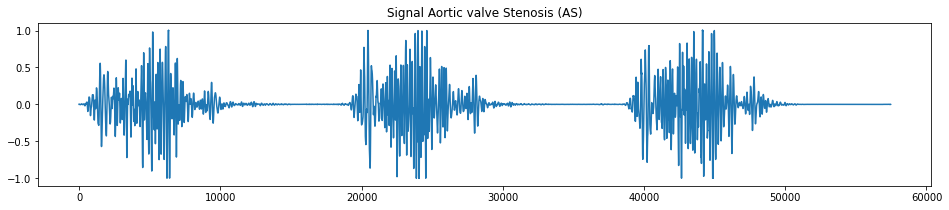

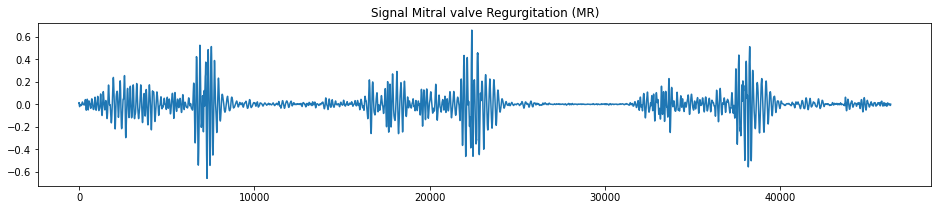

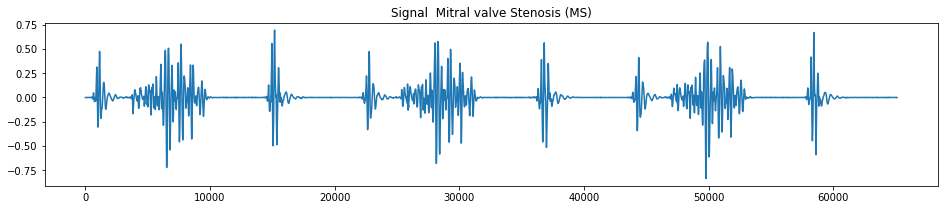

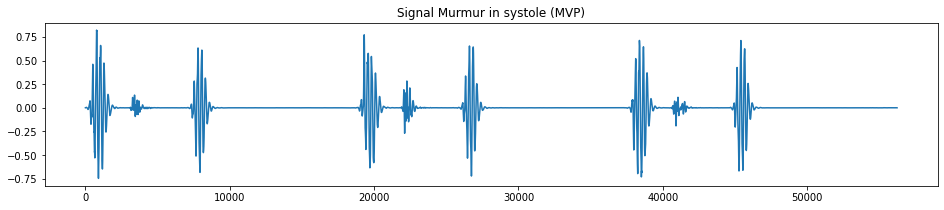

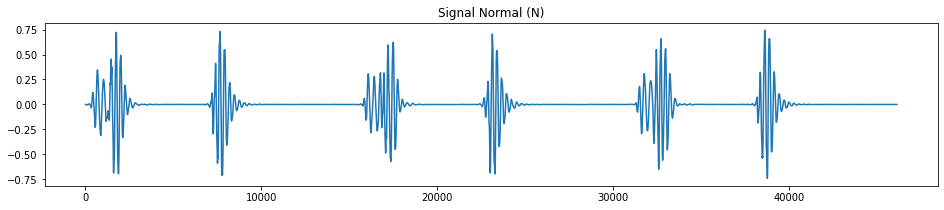

In [9]:
# plot wave by audio frames

plt.figure(figsize=(16, 3))
plt.plot(sinyalAS, '-', );
plt.title("Signal Aortic valve Stenosis (AS)")

plt.figure(figsize=(16, 3))
plt.plot(sinyalMR, '-', );
plt.title("Signal Mitral valve Regurgitation (MR)")

plt.figure(figsize=(16, 3))
plt.plot(sinyalMS, '-', );
plt.title("Signal  Mitral valve Stenosis (MS)")

plt.figure(figsize=(16, 3))
plt.plot(sinyalMVP, '-', );
plt.title("Signal Murmur in systole (MVP)")

plt.figure(figsize=(16, 3))
plt.plot(sinyalN, '-', );
plt.title("Signal Normal (N)")

plt.savefig('MFCCs_AS.png')

##**Visualizing Audio**

###**Waveform**

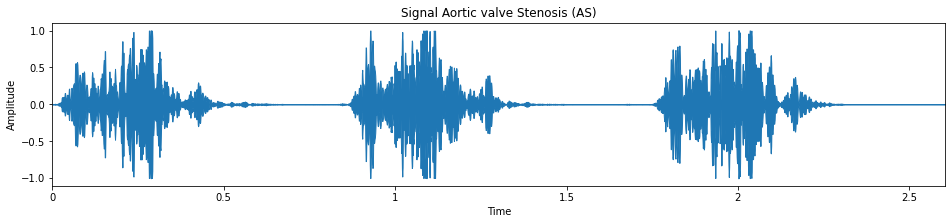

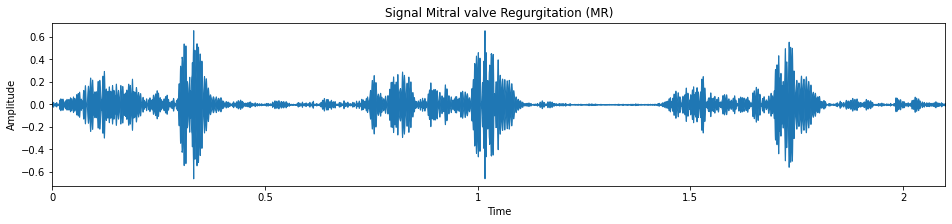

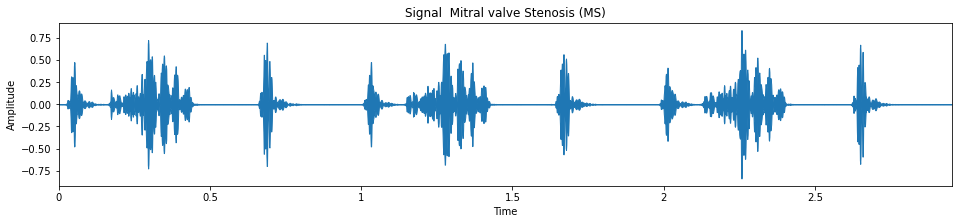

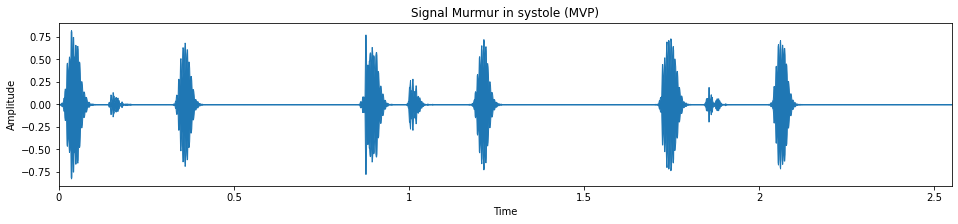

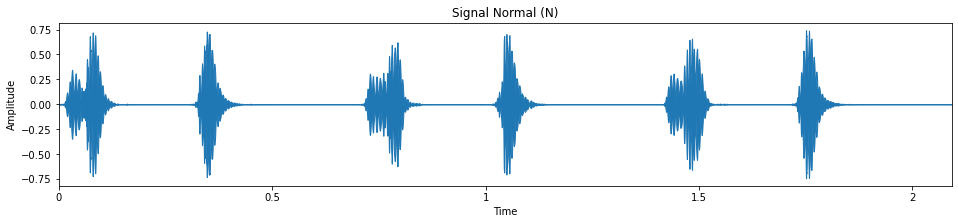

In [10]:
plt.figure(figsize=(16, 3))

librosa.display.waveplot(sinyalAS, srAS)
plt.xlabel('Time')
plt.ylabel('Amplitude')
plt.title("Signal Aortic valve Stenosis (AS)")

plt.figure(figsize=(16, 3))

librosa.display.waveplot(sinyalMR, srMR)
plt.xlabel('Time')
plt.ylabel('Amplitude')
plt.title("Signal Mitral valve Regurgitation (MR)")

plt.figure(figsize=(16, 3))

librosa.display.waveplot(sinyalMS, srMS)
plt.xlabel('Time')
plt.ylabel('Amplitude')
plt.title("Signal  Mitral valve Stenosis (MS)")

plt.figure(figsize=(16, 3))

librosa.display.waveplot(sinyalMVP, srMVP)
plt.xlabel('Time')
plt.ylabel('Amplitude')
plt.title("Signal Murmur in systole (MVP)")

plt.figure(figsize=(16, 3))

librosa.display.waveplot(sinyalN, srN)
plt.xlabel('Time')
plt.ylabel('Amplitude')
plt.title("Signal Normal (N)")

plt.show()

###**Spectogram**

Text(0.5, 1.0, 'Signal Normal (N)')

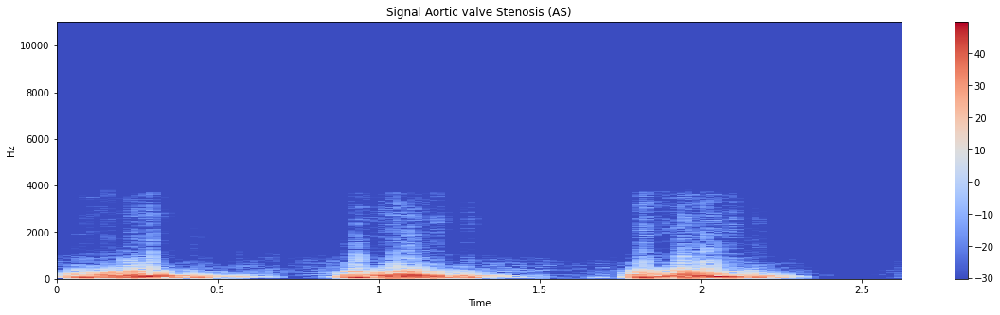

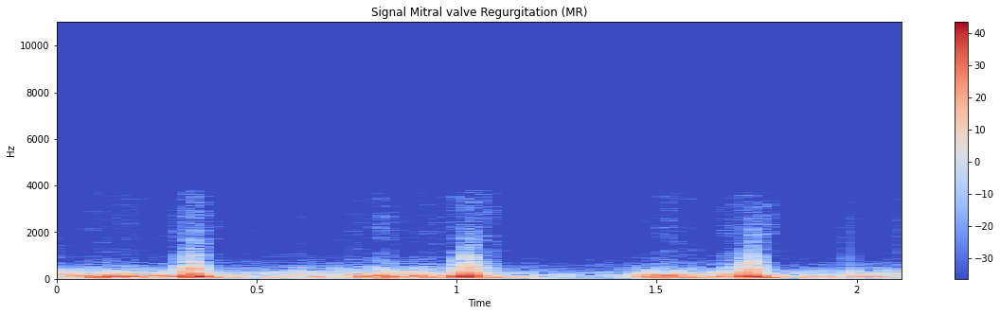

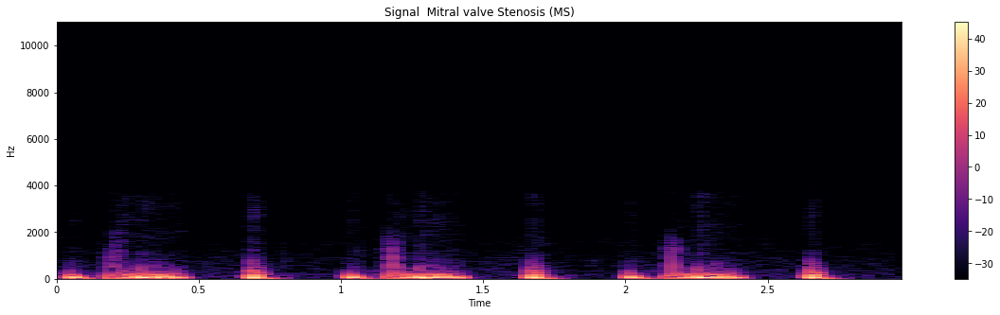

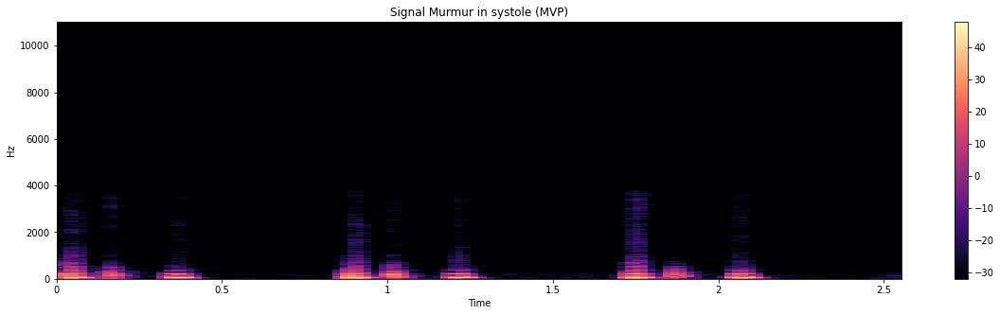

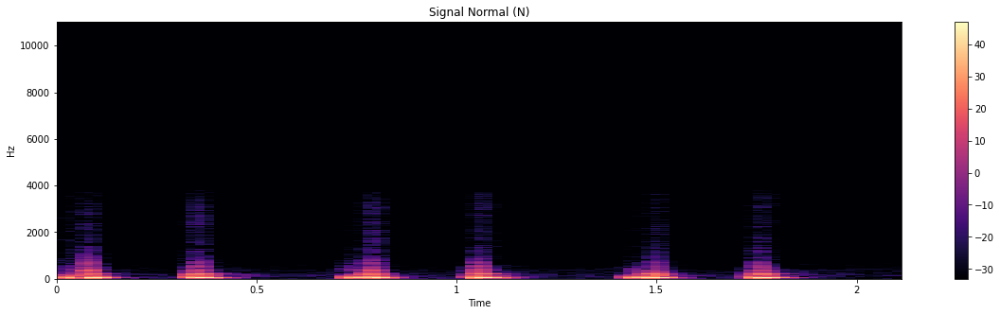

In [11]:
X1 = librosa.stft(sinyalAS)
Xdb1 = librosa.amplitude_to_db(abs(X1))
plt.figure(figsize=(20, 5))
librosa.display.specshow(Xdb1, sr=srAS, x_axis='time', y_axis='hz')
plt.colorbar()
plt.title("Signal Aortic valve Stenosis (AS)")

X2 = librosa.stft(sinyalMR)
Xdb2 = librosa.amplitude_to_db(abs(X2))
plt.figure(figsize=(20, 5))
librosa.display.specshow(Xdb2, sr=srMR, x_axis='time', y_axis='hz')
plt.colorbar()
plt.title("Signal Mitral valve Regurgitation (MR)")

X3 = librosa.stft(sinyalMS)
Xdb3 = librosa.amplitude_to_db(abs(X3))
plt.figure(figsize=(20, 5))
librosa.display.specshow(Xdb3, sr=srMS, x_axis='time', y_axis='hz')
plt.colorbar()
plt.title("Signal  Mitral valve Stenosis (MS)")

X4 = librosa.stft(sinyalMVP)
Xdb4 = librosa.amplitude_to_db(abs(X4))
plt.figure(figsize=(20, 5))
librosa.display.specshow(Xdb4, sr=srMVP, x_axis='time', y_axis='hz')
plt.colorbar()
plt.title("Signal Murmur in systole (MVP)")

X5 = librosa.stft(sinyalN)
Xdb5 = librosa.amplitude_to_db(abs(X5))
plt.figure(figsize=(20, 5))
librosa.display.specshow(Xdb5, sr=srN, x_axis='time', y_axis='hz')
plt.colorbar()
plt.title("Signal Normal (N)")

###**Log Frequency Axis**

Text(0.5, 1.0, 'Signal Normal (N)')

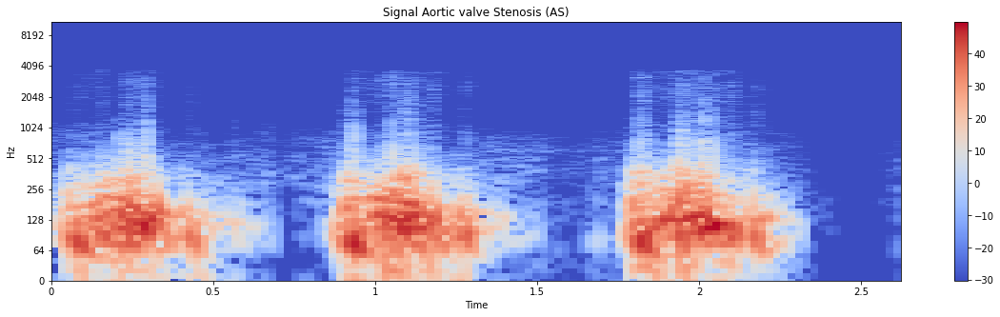

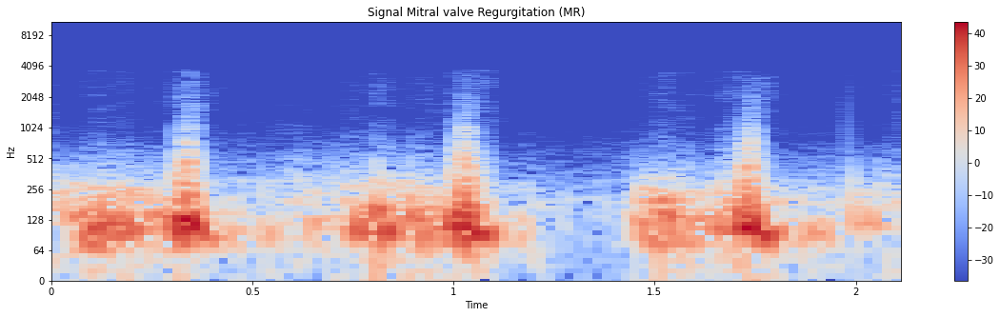

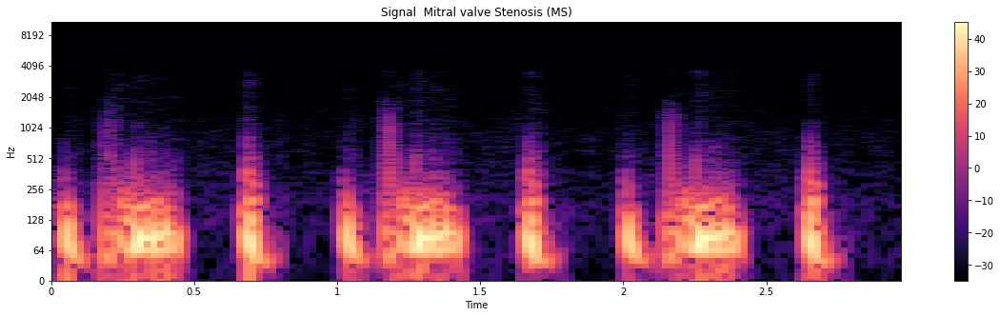

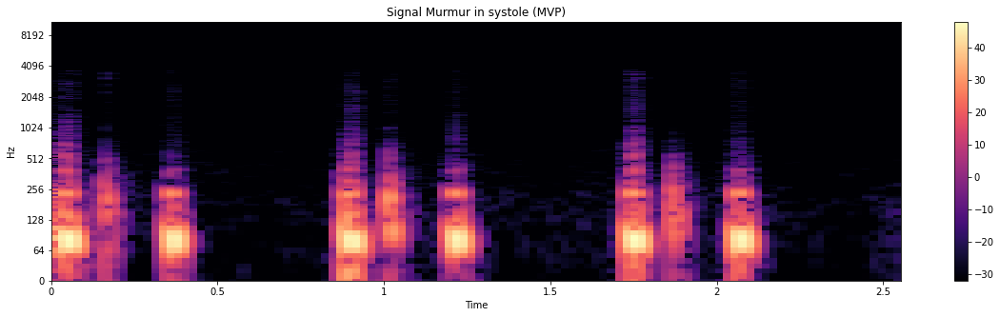

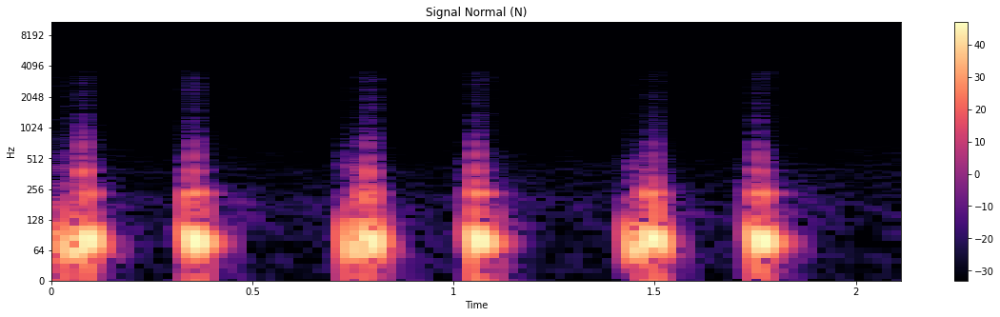

In [12]:
plt.figure(figsize=(20, 5))
librosa.display.specshow(Xdb1, sr=srAS, x_axis='time', y_axis='log')
plt.colorbar()
plt.title("Signal Aortic valve Stenosis (AS)")

plt.figure(figsize=(20, 5))
librosa.display.specshow(Xdb2, sr=srMR, x_axis='time', y_axis='log')
plt.colorbar()
plt.title("Signal Mitral valve Regurgitation (MR)")

plt.figure(figsize=(20, 5))
librosa.display.specshow(Xdb3, sr=srMS, x_axis='time', y_axis='log')
plt.colorbar()
plt.title("Signal  Mitral valve Stenosis (MS)")

plt.figure(figsize=(20, 5))
librosa.display.specshow(Xdb4, sr=srMVP, x_axis='time', y_axis='log')
plt.colorbar()
plt.title("Signal Murmur in systole (MVP)")

plt.figure(figsize=(20, 5))
librosa.display.specshow(Xdb5, sr=srN, x_axis='time', y_axis='log')
plt.colorbar()
plt.title("Signal Normal (N)")

#**Feature Extraction**

##**Root Mean-Square Energy**(Time-Domain features)


In [13]:
FRAME_LENGTH = 1024
HOP_LENGTH = 512

rms_sinyalAS = librosa.feature.rms(sinyalAS, frame_length=FRAME_LENGTH, hop_length=HOP_LENGTH)[0]
rms_sinyalMR = librosa.feature.rms(sinyalMR, frame_length=FRAME_LENGTH, hop_length=HOP_LENGTH)[0]
rms_sinyalMS = librosa.feature.rms(sinyalMS, frame_length=FRAME_LENGTH, hop_length=HOP_LENGTH)[0]
rms_sinyalMVP = librosa.feature.rms(sinyalMVP, frame_length=FRAME_LENGTH, hop_length=HOP_LENGTH)[0]
rms_sinyalN = librosa.feature.rms(sinyalN, frame_length=FRAME_LENGTH, hop_length=HOP_LENGTH)[0]

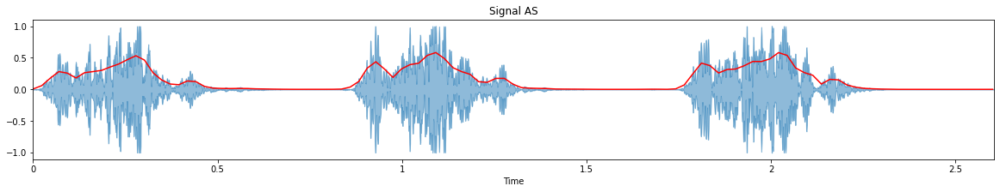

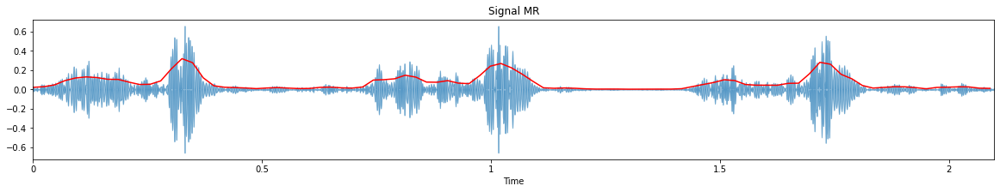

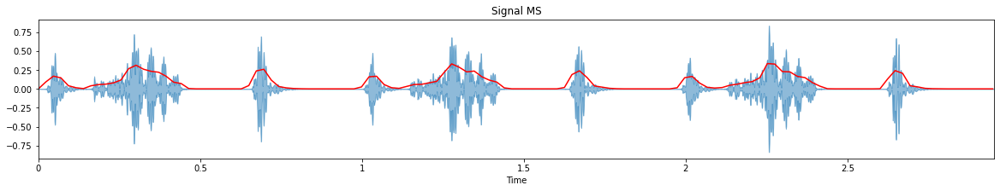

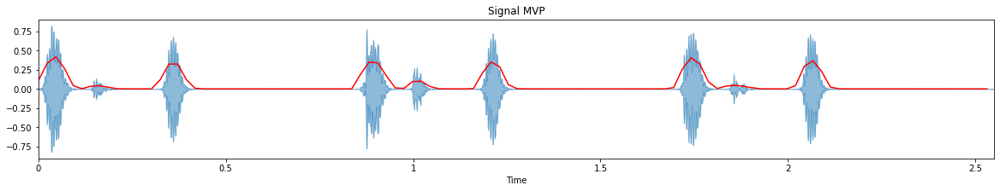

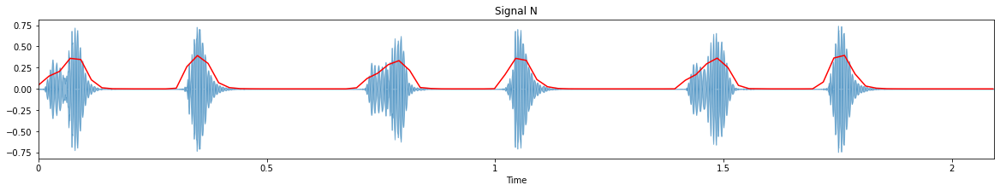

In [14]:
#plot the RMSE for all the signal pieces

frames1 = range(len(rms_sinyalAS))
t1 = librosa.frames_to_time(frames1, hop_length=HOP_LENGTH)

frames2 = range(len(rms_sinyalMR))
t2 = librosa.frames_to_time(frames2, hop_length=HOP_LENGTH)

frames3 = range(len(rms_sinyalMS))
t3 = librosa.frames_to_time(frames3, hop_length=HOP_LENGTH)

frames4 = range(len(rms_sinyalMVP))
t4 = librosa.frames_to_time(frames4, hop_length=HOP_LENGTH)

frames5 = range(len(rms_sinyalN))
t5 = librosa.frames_to_time(frames5, hop_length=HOP_LENGTH)

plt.figure(figsize=(20, 3))
librosa.display.waveplot(sinyalAS, alpha=0.5)
plt.plot(t1, rms_sinyalAS, color='r')
plt.title('Signal AS')

plt.figure(figsize=(20, 3))
librosa.display.waveplot(sinyalMR, alpha=0.5)
plt.plot(t2, rms_sinyalMR, color='r')
plt.title('Signal MR')

plt.figure(figsize=(20, 3))
librosa.display.waveplot(sinyalMS, alpha=0.5)
plt.plot(t3, rms_sinyalMS, color='r')
plt.title('Signal MS')

plt.figure(figsize=(20, 3))
librosa.display.waveplot(sinyalMVP, alpha=0.5)
plt.plot(t4, rms_sinyalMVP, color='r')
plt.title('Signal MVP')

plt.figure(figsize=(20, 3))
librosa.display.waveplot(sinyalN, alpha=0.5)
plt.plot(t5, rms_sinyalN, color='r')
plt.title('Signal N')

plt.show()



##**Spectral Centroid**(Frequency Domain)

In [15]:
FRAME_SIZE = 1024
HOP_LENGTH = 512

sc_sinyalAS = librosa.feature.spectral_centroid(sinyalAS, sr=srAS, n_fft=FRAME_SIZE, hop_length=HOP_LENGTH)[0]
sc_sinyalMR = librosa.feature.spectral_centroid(sinyalMR, sr=srMR, n_fft=FRAME_SIZE, hop_length=HOP_LENGTH)[0]
sc_sinyalMS = librosa.feature.spectral_centroid(sinyalMS, sr=srMS, n_fft=FRAME_SIZE, hop_length=HOP_LENGTH)[0]
sc_sinyalMVP = librosa.feature.spectral_centroid(sinyalMVP, sr=srMVP, n_fft=FRAME_SIZE, hop_length=HOP_LENGTH)[0]
sc_sinyalN = librosa.feature.spectral_centroid(sinyalN, sr=srN, n_fft=FRAME_SIZE, hop_length=HOP_LENGTH)[0]

sc_sinyalAS.shape, sc_sinyalMR.shape, sc_sinyalMS.shape, sc_sinyalMVP.shape, sc_sinyalN.shape

((113,), (91,), (128,), (110,), (91,))

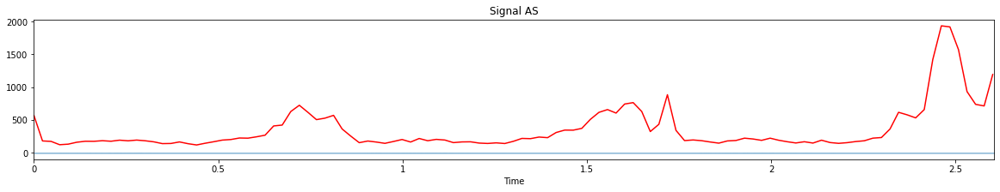

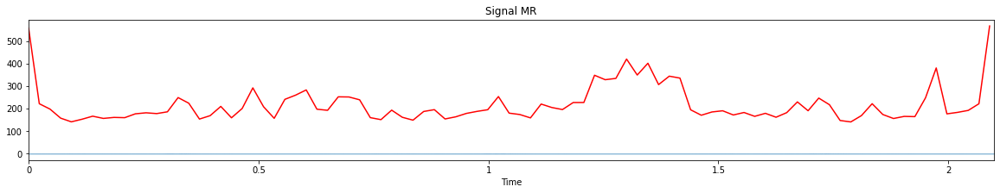

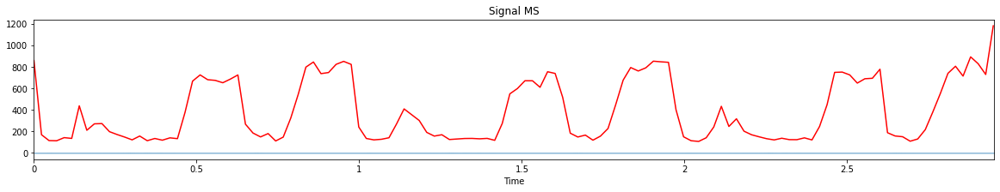

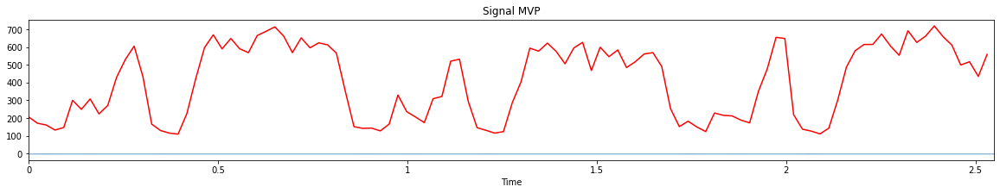

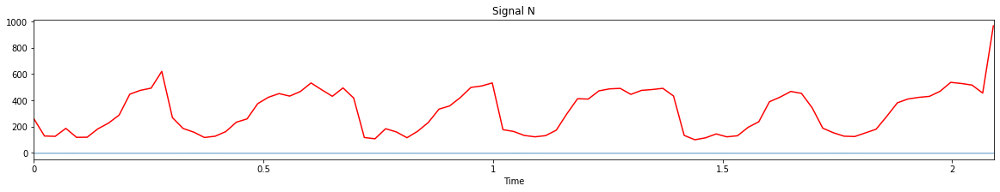

In [16]:
#plot the RMSE for all the signal pieces

frames1 = range(len(sc_sinyalAS))
t1 = librosa.frames_to_time(frames1)

frames2 = range(len(sc_sinyalMR))
t2 = librosa.frames_to_time(frames2)

frames3 = range(len(sc_sinyalMS))
t3 = librosa.frames_to_time(frames3)

frames4 = range(len(sc_sinyalMVP))
t4 = librosa.frames_to_time(frames4)

frames5 = range(len(sc_sinyalN))
t5 = librosa.frames_to_time(frames5)

plt.figure(figsize=(20, 3))
librosa.display.waveplot(sinyalAS, alpha=0.5)
plt.plot(t1, sc_sinyalAS, color='r')
plt.title('Signal AS')

plt.figure(figsize=(20, 3))
librosa.display.waveplot(sinyalMR, alpha=0.5)
plt.plot(t2, sc_sinyalMR, color='r')
plt.title('Signal MR')

plt.figure(figsize=(20, 3))
librosa.display.waveplot(sinyalMS, alpha=0.5)
plt.plot(t3, sc_sinyalMS, color='r')
plt.title('Signal MS')

plt.figure(figsize=(20, 3))
librosa.display.waveplot(sinyalMVP, alpha=0.5)
plt.plot(t4, sc_sinyalMVP, color='r')
plt.title('Signal MVP')

plt.figure(figsize=(20, 3))
librosa.display.waveplot(sinyalN, alpha=0.5)
plt.plot(t5, sc_sinyalN, color='r')
plt.title('Signal N')

plt.show()


##**Mel-Frequency Cepstral Coefficients (MFCCs)**(Time-Frequency Representation)




Check Length each feature from dataset

In [55]:
mfccs_AS = mfcc(sinyalAS, srAS)
print('\nMFCC:\nNumber of windows =', mfccs_AS.shape[0])
print('Length of each feature =', mfccs_AS.shape[1])


MFCC:
Number of windows = 259
Length of each feature = 13


In [56]:
mfccs_MR = mfcc(sinyalMR, srMR)
print('\nMFCC:\nNumber of windows =', mfccs_MR.shape[0])
print('Length of each feature =', mfccs_MR.shape[1])


MFCC:
Number of windows = 208
Length of each feature = 13


In [57]:
mfccs_MS = mfcc(sinyalMS, srMS)
print('\nMFCC:\nNumber of windows =', mfccs_MS.shape[0])
print('Length of each feature =', mfccs_MS.shape[1])


MFCC:
Number of windows = 294
Length of each feature = 13


In [58]:
mfccs_MVP = mfcc(sinyalMVP, srMVP)
print('\nMFCC:\nNumber of windows =', mfccs_MVP.shape[0])
print('Length of each feature =', mfccs_MVP.shape[1])


MFCC:
Number of windows = 253
Length of each feature = 13


In [59]:
mfccs_N = mfcc(sinyalN, srN)
print('\nMFCC:\nNumber of windows =', mfccs_N.shape[0])
print('Length of each feature =', mfccs_N.shape[1])


MFCC:
Number of windows = 208
Length of each feature = 13


Extract MFCCs

In [45]:
# Get more components
mfccs1 = librosa.feature.mfcc(sinyalAS, sr=srAS, n_mfcc=13)
mfccs2 = librosa.feature.mfcc(sinyalMR, sr=srMR, n_mfcc=13)
mfccs3 = librosa.feature.mfcc(sinyalMS, sr=srMS, n_mfcc=13)
mfccs4 = librosa.feature.mfcc(sinyalMVP, sr=srMVP, n_mfcc=13)
mfccs5 = librosa.feature.mfcc(sinyalN, sr=srN, n_mfcc=13)
print (mfccs1)


[[-4.23273651e+02 -4.00148895e+02 -3.81612701e+02 ... -4.86475037e+02
  -4.80593414e+02 -4.70885712e+02]
 [ 8.33266144e+01  1.14183929e+02  1.36923981e+02 ...  1.54318309e+00
   9.48984623e+00  2.24123726e+01]
 [ 6.40341110e+01  8.99074707e+01  1.05043564e+02 ...  1.37111425e+00
   8.26811981e+00  1.90070210e+01]
 ...
 [-1.31103849e+00 -3.75025797e+00 -2.98914766e+00 ... -3.00242126e-01
  -1.64696074e+00 -2.56731391e-01]
 [-4.68352938e+00 -6.16948318e+00 -4.54739904e+00 ... -3.73522878e-01
  -1.31616986e+00  1.82380378e-01]
 [-5.76381207e+00 -4.61155605e+00 -1.92977643e+00 ... -4.63467330e-01
  -9.40001130e-01  5.20350933e-01]]


In [46]:
mfccs1.shape

(13, 113)

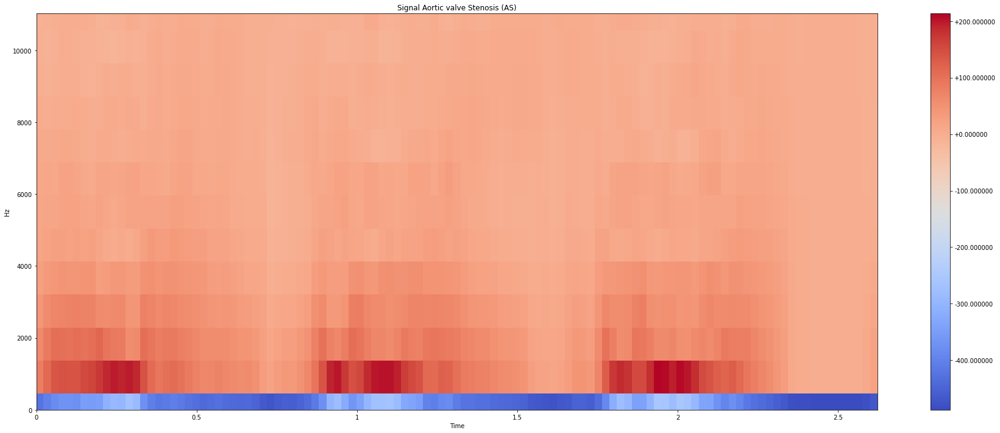

In [47]:
plt.figure(figsize=(25, 10))
librosa.display.specshow(mfccs1,
                         sr=srAS,
                         x_axis='time',
                         y_axis='hz')
plt.colorbar(format="%+2f")
plt.title("Signal Aortic valve Stenosis (AS)")
plt.tight_layout()

In [48]:
delta_mfccs = librosa.feature.delta(mfccs1)
delta2_mfccs = librosa.feature.delta(mfccs1, order=2)

In [49]:
delta_mfccs.shape

(13, 113)

In [50]:
mfccs1.shape

(13, 113)

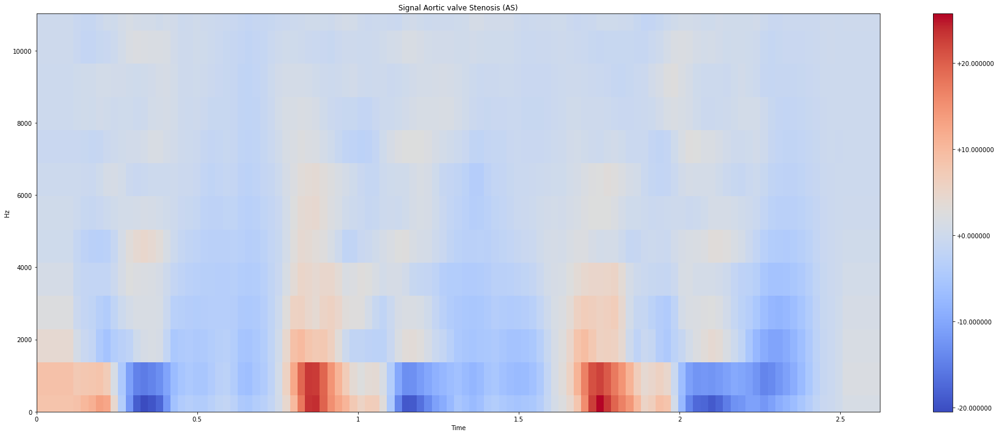

In [51]:
plt.figure(figsize=(25, 10))
librosa.display.specshow(delta_mfccs,
                         sr=srAS,
                         x_axis='time',
                         y_axis='hz')
plt.colorbar(format="%+2f")
plt.title("Signal Aortic valve Stenosis (AS)")
plt.tight_layout()

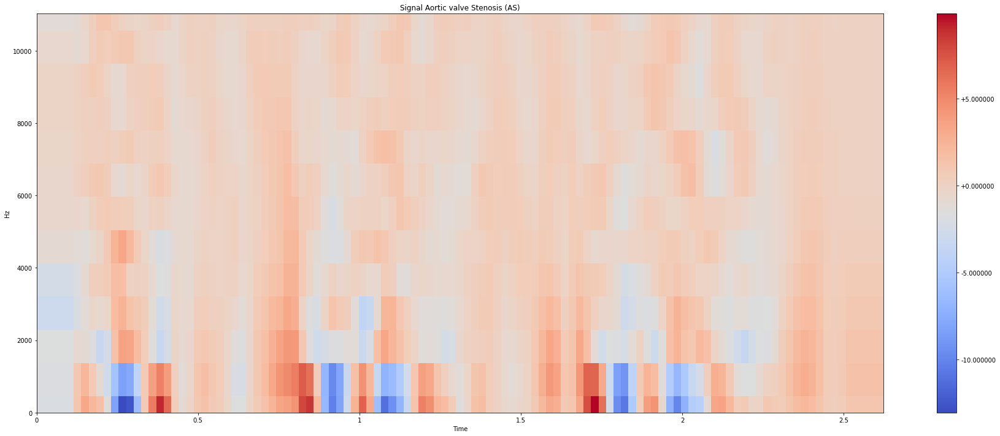

In [52]:
plt.figure(figsize=(25, 10))
librosa.display.specshow(delta2_mfccs,
                         sr=srAS,
                         x_axis='time',
                         y_axis='hz')
plt.colorbar(format="%+2f")
plt.title("Signal Aortic valve Stenosis (AS)")
plt.tight_layout()

In [53]:
comprehensive_mfccs = np.concatenate((mfccs1, delta_mfccs, delta2_mfccs))

In [54]:
comprehensive_mfccs.shape

(39, 113)

Visualize MFCCs

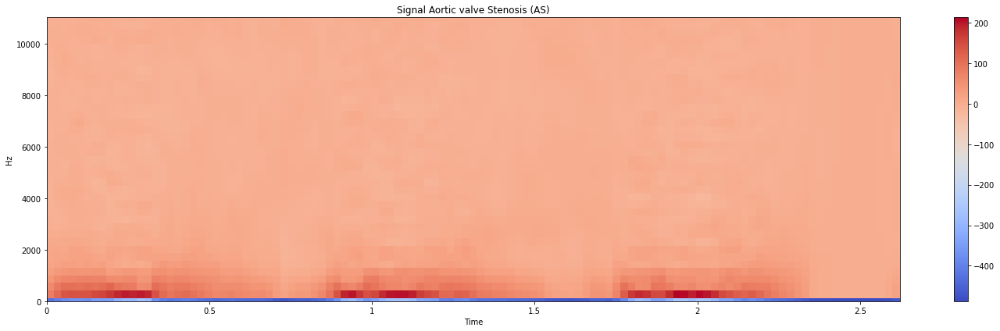

In [ ]:
plt.figure(figsize=(20, 6))
librosa.display.specshow(mfccs1,
                         sr=srAS,
                         x_axis='time',
                         y_axis='hz')
plt.colorbar()
plt.title("Signal Aortic valve Stenosis (AS)")
plt.tight_layout()
plt.savefig('MFCCs_AS.png')


##**Creating Dataset with Feature Extraction**

###**One Algorithm**

####**Root Mean Square**

In [60]:
header = 'filename rms' 
header += ' label'
header = header.split()

In [61]:
FRAME_LENGTH = 1024
HOP_LENGTH = 512

file = open('RMS.csv', 'w', newline='')
with file:
    writer = csv.writer(file)
    writer.writerow(header)
genres = 'AS MR MS MVP N'.split()
for g in genres:
    for filename in os.listdir(f'/content/gdrive/My Drive/Dataset_TA_testing/{g}'):
        signal = f'/content/gdrive/My Drive/Dataset_TA_testing/{g}/{filename}'
        # use kaiser_fast technique for faster extraction
        y, sr = librosa.load(signal, mono=True, duration=3, res_type='kaiser_fast')
        rms = librosa.feature.rms(y, frame_length=FRAME_LENGTH, hop_length=HOP_LENGTH)[0]
        to_append = f'{filename} {np.mean(rms)}'   
        to_append += f' {g}'
        file = open('RMS.csv', 'a', newline='')
        with file:
            writer = csv.writer(file)
            writer.writerow(to_append.split())

####**Spectral Domain**

In [62]:
header = 'filename sc' 
header += ' label'
header = header.split()

In [63]:
FRAME_SIZE = 1024
HOP_LENGTH = 512

file = open('SC.csv', 'w', newline='')
with file:
    writer = csv.writer(file)
    writer.writerow(header)
genres = 'AS MR MS MVP N'.split()
for g in genres:
    for filename in os.listdir(f'/content/gdrive/My Drive/Dataset_TA_testing/{g}'):
        signal = f'/content/gdrive/My Drive/Dataset_TA_testing/{g}/{filename}'
        # use kaiser_fast technique for faster extraction
        y, sr = librosa.load(signal, mono=True, duration=3, res_type='kaiser_fast')
        sc = librosa.feature.spectral_centroid(y=y, sr=sr, n_fft=FRAME_SIZE, hop_length=HOP_LENGTH)[0]
        to_append = f'{filename} {np.mean(sc)}'   
        to_append += f' {g}'
        file = open('SC.csv', 'a', newline='')
        with file:
            writer = csv.writer(file)
            writer.writerow(to_append.split())

####**Mel-Frequency Cepstral Coefficients**

In [64]:
header = 'filename' 
for i in range(1, 40):
    header += f' mfcc{i}'
header += ' label'
header = header.split()

In [65]:
file = open('MFCCs.csv', 'w', newline='')
with file:
    writer = csv.writer(file)
    writer.writerow(header)
genres = 'AS MR MS MVP N'.split()
for g in genres:
    for filename in os.listdir(f'/content/gdrive/My Drive/Dataset_TA_testing/{g}'):
        signal = f'/content/gdrive/My Drive/Dataset_TA_testing/{g}/{filename}'
        # use kaiser_fast technique for faster extraction
        y, sr = librosa.load(signal, mono=True, duration=3, res_type='kaiser_fast')
        mfcc = librosa.feature.mfcc(y=y, sr=sr, n_mfcc=39)
        to_append = f'{filename}'  
        for e in mfcc:
            to_append += f' {np.mean(e.T,axis=0)}'
        to_append += f' {g}'
        file = open('MFCCs.csv', 'a', newline='')
        with file:
            writer = csv.writer(file)
            writer.writerow(to_append.split())

###**Two Algorithm**

####**Root Mean Square + Spectral Centroid**


In [66]:
header = 'filename rms sc' 
header += ' label'
header = header.split()

In [67]:
file = open('RMS+SC.csv', 'w', newline='')
with file:
    writer = csv.writer(file)
    writer.writerow(header)
genres = 'AS MR MS MVP N'.split()
for g in genres:
    for filename in os.listdir(f'/content/gdrive/My Drive/Dataset_TA_testing/{g}'):
        signal = f'/content/gdrive/My Drive/Dataset_TA_testing/{g}/{filename}'
        # use kaiser_fast technique for faster extraction
        y, sr = librosa.load(signal, mono=True,duration=3, res_type='kaiser_fast')
        rms = librosa.feature.rms(y, frame_length=FRAME_LENGTH, hop_length=HOP_LENGTH)[0]
        sc = librosa.feature.spectral_centroid(y=y, sr=sr, n_fft=FRAME_SIZE, hop_length=HOP_LENGTH)[0]
        to_append = f'{filename} {np.mean(rms)} {np.mean(sc)}'
        to_append += f' {g}'
        file = open('RMS+SC.csv', 'a', newline='')
        with file:
            writer = csv.writer(file)
            writer.writerow(to_append.split())

####**Root Mean Square + Mel-Frequency Cepstral Coefficients(MFCCs)**

In [68]:
header = 'filename rms' 
for i in range(1, 40):
    header += f' mfcc{i}'
header += ' label'
header = header.split()

In [69]:
file = open('RMS+MFCCs.csv', 'w', newline='')
with file:
    writer = csv.writer(file)
    writer.writerow(header)
genres = 'AS MR MS MVP N'.split()
for g in genres:
    for filename in os.listdir(f'/content/gdrive/My Drive/Dataset_TA_testing/{g}'):
        signal = f'/content/gdrive/My Drive/Dataset_TA_testing/{g}/{filename}'
        # use kaiser_fast technique for faster extraction
        y, sr = librosa.load(signal, mono=True, duration=3, res_type='kaiser_fast')
        rms = librosa.feature.rms(y, frame_length=FRAME_LENGTH, hop_length=HOP_LENGTH)[0]
        mfcc = librosa.feature.mfcc(y=y, sr=sr, n_mfcc=39)
        to_append = f'{filename} {np.mean(rms)}'   
        for e in mfcc:
            to_append += f' {np.mean(e.T,axis=0)}'
        to_append += f' {g}'
        file = open('RMS+MFCCs.csv', 'a', newline='')
        with file:
            writer = csv.writer(file)
            writer.writerow(to_append.split())

####**Spectral Centroid + Mel-Frequency Cepstral Coefficients(MFCCs)**

In [70]:
header = 'filename sc' 
for i in range(1, 40):
    header += f' mfcc{i}'
header += ' label'
header = header.split()

In [71]:
file = open('SC+MFCCs.csv', 'w', newline='')
with file:
    writer = csv.writer(file)
    writer.writerow(header)
genres = 'AS MR MS MVP N'.split()
for g in genres:
    for filename in os.listdir(f'/content/gdrive/My Drive/Dataset_TA_testing/{g}'):
        signal = f'/content/gdrive/My Drive/Dataset_TA_testing/{g}/{filename}'
        # use kaiser_fast technique for faster extraction
        y, sr = librosa.load(signal, mono=True,duration=3, res_type='kaiser_fast')
        sc = librosa.feature.spectral_centroid(y=y, sr=sr, n_fft=FRAME_SIZE, hop_length=HOP_LENGTH)[0]
        mfcc = librosa.feature.mfcc(y=y, sr=sr, n_mfcc=39)
        to_append = f'{filename} {np.mean(sc)}'   
        for e in mfcc:
            to_append += f' {np.mean(e.T,axis=0)}'
        to_append += f' {g}'
        file = open('SC+MFCCs.csv', 'a', newline='')
        with file:
            writer = csv.writer(file)
            writer.writerow(to_append.split())

###**Three Algorithm**

####**RMS + SC + MFCCs**

In [72]:
header = 'filename rms sc' 
for i in range(1, 40):
    header += f' mfcc{i}'
header += ' label'
header = header.split()

In [73]:
file = open('RMS+SC+MFCCs.csv', 'w', newline='')
with file:
    writer = csv.writer(file)
    writer.writerow(header)
genres = 'AS MR MS MVP N'.split()
for g in genres:
    for filename in os.listdir(f'/content/gdrive/My Drive/Dataset_TA_testing/{g}'):
        signal = f'/content/gdrive/My Drive/Dataset_TA_testing/{g}/{filename}'
        # use kaiser_fast technique for faster extraction
        y, sr = librosa.load(signal, mono=True,duration=3, res_type='kaiser_fast')
        rms = librosa.feature.rms(y, frame_length=FRAME_LENGTH, hop_length=HOP_LENGTH)[0]
        sc = librosa.feature.spectral_centroid(y=y, sr=sr, n_fft=FRAME_SIZE, hop_length=HOP_LENGTH)[0]
        mfcc = librosa.feature.mfcc(y=y, sr=sr, n_mfcc=39)
        to_append = f'{filename} {np.mean(rms)} {np.mean(sc)}'   
        for e in mfcc:
            to_append += f' {np.mean(e.T,axis=0)}'
        to_append += f' {g}'
        file = open('RMS+SC+MFCCs.csv', 'a', newline='')
        with file:
            writer = csv.writer(file)
            writer.writerow(to_append.split())

##**Continue to Create Dataset**

**Reading a Dataset**

####**One Algorithm**

In [74]:
data1_1 = pd.read_csv('RMS.csv')
data1_1.head()

,filename,rms,label
0,New_AS_001.wav,0.151038,AS
1,New_AS_002.wav,0.151219,AS
2,New_AS_003.wav,0.150414,AS
3,New_AS_004.wav,0.150788,AS
4,New_AS_005.wav,0.148349,AS


In [75]:
data1_2 = pd.read_csv('SC.csv')
data1_2.head()

,filename,sc,label
0,New_AS_001.wav,339.484026,AS
1,New_AS_002.wav,336.563694,AS
2,New_AS_003.wav,336.084863,AS
3,New_AS_004.wav,332.470951,AS
4,New_AS_005.wav,333.638571,AS


In [76]:
data1_3 = pd.read_csv('MFCCs.csv')
data1_3.head()

,filename,mfcc1,mfcc2,mfcc3,mfcc4,mfcc5,mfcc6,mfcc7,mfcc8,mfcc9,mfcc10,mfcc11,mfcc12,mfcc13,mfcc14,mfcc15,mfcc16,mfcc17,mfcc18,mfcc19,mfcc20,mfcc21,mfcc22,mfcc23,mfcc24,mfcc25,mfcc26,mfcc27,mfcc28,mfcc29,mfcc30,mfcc31,mfcc32,mfcc33,mfcc34,mfcc35,mfcc36,mfcc37,mfcc38,mfcc39,label
0,New_AS_001.wav,-396.041992,102.596733,60.768349,43.350719,31.317719,15.110195,10.741218,11.311575,5.674284,2.837271,3.624679,0.902705,-0.894656,-0.047814,-1.440738,-2.511029,-1.194814,-1.336148,-2.313967,-2.061921,-2.389354,-3.154080,-3.139873,-3.255658,-3.509723,-3.864495,-4.742834,-4.609274,-3.421695,-3.337991,-3.749539,-3.492603,-3.600422,-3.570766,-2.524447,-1.939449,-2.021299,-1.612270,-1.451503,AS
1,New_AS_002.wav,-393.859650,103.150703,56.890339,42.117702,32.664745,15.694667,10.947487,10.999839,4.318734,2.341624,4.634564,1.900761,-0.547078,-0.261506,-1.845431,-2.491283,-1.028300,-1.259388,-1.907486,-1.726204,-2.475584,-3.118418,-3.227350,-3.880544,-3.977055,-3.934241,-4.774628,-4.439967,-3.180894,-3.321476,-3.622622,-3.409570,-4.131164,-4.411778,-3.267706,-2.697658,-2.716461,-2.180110,-1.973177,AS
2,New_AS_003.wav,-397.272827,104.662491,57.698475,42.841106,32.695595,15.198275,11.076296,11.581809,4.863283,3.067552,4.866862,1.125124,-0.946775,0.469344,-1.300708,-2.819281,-1.444930,-1.337584,-1.799471,-1.601247,-2.635008,-3.429166,-3.117566,-3.659541,-4.276107,-4.055712,-4.118158,-4.150308,-3.996596,-4.215799,-3.920124,-3.334875,-3.454411,-3.152452,-2.310371,-2.313471,-2.383988,-1.755316,-1.478483,AS
3,New_AS_004.wav,-396.585693,103.161224,57.892849,42.997288,32.933929,15.878225,11.310264,11.368533,4.690406,2.574876,4.174922,0.779866,-1.263888,-0.038925,-1.542186,-2.697790,-1.175388,-1.001434,-1.520844,-1.362290,-2.454252,-3.615364,-3.495631,-3.730718,-4.275068,-4.228554,-4.035867,-3.880296,-4.067172,-4.395358,-3.803739,-3.132231,-3.379053,-3.297994,-2.739366,-2.697927,-2.614758,-2.211596,-1.973449,AS
4,New_AS_005.wav,-399.219574,103.852081,58.298985,43.281349,32.349636,14.706386,11.285482,12.583764,5.590585,2.916768,4.399523,0.531204,-1.665542,0.086665,-1.449108,-2.810517,-0.849887,-1.042615,-2.855625,-2.734900,-2.675051,-3.270363,-3.207991,-3.472809,-4.040090,-4.189731,-4.513515,-4.633006,-4.258320,-4.172172,-3.962976,-3.402735,-3.294645,-3.180889,-2.652208,-2.457017,-2.421641,-2.210134,-2.277565,AS


####**Two Algorithm**

In [77]:
data2_1 = pd.read_csv('RMS+SC.csv')
data2_1.head()

,filename,rms,sc,label
0,New_AS_001.wav,0.151038,339.484026,AS
1,New_AS_002.wav,0.151219,336.563694,AS
2,New_AS_003.wav,0.150414,336.084863,AS
3,New_AS_004.wav,0.150788,332.470951,AS
4,New_AS_005.wav,0.148349,333.638571,AS


In [78]:
data2_2 = pd.read_csv('RMS+MFCCs.csv')
data2_2.head()

,filename,rms,mfcc1,mfcc2,mfcc3,mfcc4,mfcc5,mfcc6,mfcc7,mfcc8,mfcc9,mfcc10,mfcc11,mfcc12,mfcc13,mfcc14,mfcc15,mfcc16,mfcc17,mfcc18,mfcc19,mfcc20,mfcc21,mfcc22,mfcc23,mfcc24,mfcc25,mfcc26,mfcc27,mfcc28,mfcc29,mfcc30,mfcc31,mfcc32,mfcc33,mfcc34,mfcc35,mfcc36,mfcc37,mfcc38,mfcc39,label
0,New_AS_001.wav,0.151038,-396.041992,102.596733,60.768349,43.350719,31.317719,15.110195,10.741218,11.311575,5.674284,2.837271,3.624679,0.902705,-0.894656,-0.047814,-1.440738,-2.511029,-1.194814,-1.336148,-2.313967,-2.061921,-2.389354,-3.154080,-3.139873,-3.255658,-3.509723,-3.864495,-4.742834,-4.609274,-3.421695,-3.337991,-3.749539,-3.492603,-3.600422,-3.570766,-2.524447,-1.939449,-2.021299,-1.612270,-1.451503,AS
1,New_AS_002.wav,0.151219,-393.859650,103.150703,56.890339,42.117702,32.664745,15.694667,10.947487,10.999839,4.318734,2.341624,4.634564,1.900761,-0.547078,-0.261506,-1.845431,-2.491283,-1.028300,-1.259388,-1.907486,-1.726204,-2.475584,-3.118418,-3.227350,-3.880544,-3.977055,-3.934241,-4.774628,-4.439967,-3.180894,-3.321476,-3.622622,-3.409570,-4.131164,-4.411778,-3.267706,-2.697658,-2.716461,-2.180110,-1.973177,AS
2,New_AS_003.wav,0.150414,-397.272827,104.662491,57.698475,42.841106,32.695595,15.198275,11.076296,11.581809,4.863283,3.067552,4.866862,1.125124,-0.946775,0.469344,-1.300708,-2.819281,-1.444930,-1.337584,-1.799471,-1.601247,-2.635008,-3.429166,-3.117566,-3.659541,-4.276107,-4.055712,-4.118158,-4.150308,-3.996596,-4.215799,-3.920124,-3.334875,-3.454411,-3.152452,-2.310371,-2.313471,-2.383988,-1.755316,-1.478483,AS
3,New_AS_004.wav,0.150788,-396.585693,103.161224,57.892849,42.997288,32.933929,15.878225,11.310264,11.368533,4.690406,2.574876,4.174922,0.779866,-1.263888,-0.038925,-1.542186,-2.697790,-1.175388,-1.001434,-1.520844,-1.362290,-2.454252,-3.615364,-3.495631,-3.730718,-4.275068,-4.228554,-4.035867,-3.880296,-4.067172,-4.395358,-3.803739,-3.132231,-3.379053,-3.297994,-2.739366,-2.697927,-2.614758,-2.211596,-1.973449,AS
4,New_AS_005.wav,0.148349,-399.219574,103.852081,58.298985,43.281349,32.349636,14.706386,11.285482,12.583764,5.590585,2.916768,4.399523,0.531204,-1.665542,0.086665,-1.449108,-2.810517,-0.849887,-1.042615,-2.855625,-2.734900,-2.675051,-3.270363,-3.207991,-3.472809,-4.040090,-4.189731,-4.513515,-4.633006,-4.258320,-4.172172,-3.962976,-3.402735,-3.294645,-3.180889,-2.652208,-2.457017,-2.421641,-2.210134,-2.277565,AS


In [79]:
data2_3 = pd.read_csv('SC+MFCCs.csv')
data2_3.head()

,filename,sc,mfcc1,mfcc2,mfcc3,mfcc4,mfcc5,mfcc6,mfcc7,mfcc8,mfcc9,mfcc10,mfcc11,mfcc12,mfcc13,mfcc14,mfcc15,mfcc16,mfcc17,mfcc18,mfcc19,mfcc20,mfcc21,mfcc22,mfcc23,mfcc24,mfcc25,mfcc26,mfcc27,mfcc28,mfcc29,mfcc30,mfcc31,mfcc32,mfcc33,mfcc34,mfcc35,mfcc36,mfcc37,mfcc38,mfcc39,label
0,New_AS_001.wav,339.484026,-396.041992,102.596733,60.768349,43.350719,31.317719,15.110195,10.741218,11.311575,5.674284,2.837271,3.624679,0.902705,-0.894656,-0.047814,-1.440738,-2.511029,-1.194814,-1.336148,-2.313967,-2.061921,-2.389354,-3.154080,-3.139873,-3.255658,-3.509723,-3.864495,-4.742834,-4.609274,-3.421695,-3.337991,-3.749539,-3.492603,-3.600422,-3.570766,-2.524447,-1.939449,-2.021299,-1.612270,-1.451503,AS
1,New_AS_002.wav,336.563694,-393.859650,103.150703,56.890339,42.117702,32.664745,15.694667,10.947487,10.999839,4.318734,2.341624,4.634564,1.900761,-0.547078,-0.261506,-1.845431,-2.491283,-1.028300,-1.259388,-1.907486,-1.726204,-2.475584,-3.118418,-3.227350,-3.880544,-3.977055,-3.934241,-4.774628,-4.439967,-3.180894,-3.321476,-3.622622,-3.409570,-4.131164,-4.411778,-3.267706,-2.697658,-2.716461,-2.180110,-1.973177,AS
2,New_AS_003.wav,336.084863,-397.272827,104.662491,57.698475,42.841106,32.695595,15.198275,11.076296,11.581809,4.863283,3.067552,4.866862,1.125124,-0.946775,0.469344,-1.300708,-2.819281,-1.444930,-1.337584,-1.799471,-1.601247,-2.635008,-3.429166,-3.117566,-3.659541,-4.276107,-4.055712,-4.118158,-4.150308,-3.996596,-4.215799,-3.920124,-3.334875,-3.454411,-3.152452,-2.310371,-2.313471,-2.383988,-1.755316,-1.478483,AS
3,New_AS_004.wav,332.470951,-396.585693,103.161224,57.892849,42.997288,32.933929,15.878225,11.310264,11.368533,4.690406,2.574876,4.174922,0.779866,-1.263888,-0.038925,-1.542186,-2.697790,-1.175388,-1.001434,-1.520844,-1.362290,-2.454252,-3.615364,-3.495631,-3.730718,-4.275068,-4.228554,-4.035867,-3.880296,-4.067172,-4.395358,-3.803739,-3.132231,-3.379053,-3.297994,-2.739366,-2.697927,-2.614758,-2.211596,-1.973449,AS
4,New_AS_005.wav,333.638571,-399.219574,103.852081,58.298985,43.281349,32.349636,14.706386,11.285482,12.583764,5.590585,2.916768,4.399523,0.531204,-1.665542,0.086665,-1.449108,-2.810517,-0.849887,-1.042615,-2.855625,-2.734900,-2.675051,-3.270363,-3.207991,-3.472809,-4.040090,-4.189731,-4.513515,-4.633006,-4.258320,-4.172172,-3.962976,-3.402735,-3.294645,-3.180889,-2.652208,-2.457017,-2.421641,-2.210134,-2.277565,AS


####**Three Algorithm**

In [80]:
data3 = pd.read_csv('RMS+SC+MFCCs.csv')
data3.head()

,filename,rms,sc,mfcc1,mfcc2,mfcc3,mfcc4,mfcc5,mfcc6,mfcc7,mfcc8,mfcc9,mfcc10,mfcc11,mfcc12,mfcc13,mfcc14,mfcc15,mfcc16,mfcc17,mfcc18,mfcc19,mfcc20,mfcc21,mfcc22,mfcc23,mfcc24,mfcc25,mfcc26,mfcc27,mfcc28,mfcc29,mfcc30,mfcc31,mfcc32,mfcc33,mfcc34,mfcc35,mfcc36,mfcc37,mfcc38,mfcc39,label
0,New_AS_001.wav,0.151038,339.484026,-396.041992,102.596733,60.768349,43.350719,31.317719,15.110195,10.741218,11.311575,5.674284,2.837271,3.624679,0.902705,-0.894656,-0.047814,-1.440738,-2.511029,-1.194814,-1.336148,-2.313967,-2.061921,-2.389354,-3.154080,-3.139873,-3.255658,-3.509723,-3.864495,-4.742834,-4.609274,-3.421695,-3.337991,-3.749539,-3.492603,-3.600422,-3.570766,-2.524447,-1.939449,-2.021299,-1.612270,-1.451503,AS
1,New_AS_002.wav,0.151219,336.563694,-393.859650,103.150703,56.890339,42.117702,32.664745,15.694667,10.947487,10.999839,4.318734,2.341624,4.634564,1.900761,-0.547078,-0.261506,-1.845431,-2.491283,-1.028300,-1.259388,-1.907486,-1.726204,-2.475584,-3.118418,-3.227350,-3.880544,-3.977055,-3.934241,-4.774628,-4.439967,-3.180894,-3.321476,-3.622622,-3.409570,-4.131164,-4.411778,-3.267706,-2.697658,-2.716461,-2.180110,-1.973177,AS
2,New_AS_003.wav,0.150414,336.084863,-397.272827,104.662491,57.698475,42.841106,32.695595,15.198275,11.076296,11.581809,4.863283,3.067552,4.866862,1.125124,-0.946775,0.469344,-1.300708,-2.819281,-1.444930,-1.337584,-1.799471,-1.601247,-2.635008,-3.429166,-3.117566,-3.659541,-4.276107,-4.055712,-4.118158,-4.150308,-3.996596,-4.215799,-3.920124,-3.334875,-3.454411,-3.152452,-2.310371,-2.313471,-2.383988,-1.755316,-1.478483,AS
3,New_AS_004.wav,0.150788,332.470951,-396.585693,103.161224,57.892849,42.997288,32.933929,15.878225,11.310264,11.368533,4.690406,2.574876,4.174922,0.779866,-1.263888,-0.038925,-1.542186,-2.697790,-1.175388,-1.001434,-1.520844,-1.362290,-2.454252,-3.615364,-3.495631,-3.730718,-4.275068,-4.228554,-4.035867,-3.880296,-4.067172,-4.395358,-3.803739,-3.132231,-3.379053,-3.297994,-2.739366,-2.697927,-2.614758,-2.211596,-1.973449,AS
4,New_AS_005.wav,0.148349,333.638571,-399.219574,103.852081,58.298985,43.281349,32.349636,14.706386,11.285482,12.583764,5.590585,2.916768,4.399523,0.531204,-1.665542,0.086665,-1.449108,-2.810517,-0.849887,-1.042615,-2.855625,-2.734900,-2.675051,-3.270363,-3.207991,-3.472809,-4.040090,-4.189731,-4.513515,-4.633006,-4.258320,-4.172172,-3.962976,-3.402735,-3.294645,-3.180889,-2.652208,-2.457017,-2.421641,-2.210134,-2.277565,AS


##**Prepare data before feature selectiont**

###**Check Data**

In [81]:
print('RMS :',data1_1.shape)
print('SC :', data1_2.shape)
print('MFCCs :', data1_3.shape)
print('RMS + SC :', data2_1.shape)
print('RMS + MFCCs :', data2_2.shape)
print('SC + MFCCs :', data2_3.shape)
print('RMS + SC + MFCCs :', data3.shape)

RMS : (1000, 3)
SC : (1000, 3)
MFCCs : (1000, 41)
RMS + SC : (1000, 4)
RMS + MFCCs : (1000, 42)
SC + MFCCs : (1000, 42)
RMS + SC + MFCCs : (1000, 43)


###**Dropping unnecessary columns**

In [82]:
data1_1 = data1_1.drop(['filename'], axis=1)
data1_2= data1_2.drop(['filename'], axis=1)
data1_3 = data1_3.drop(['filename'], axis=1)
data2_1 = data2_1.drop(['filename'], axis=1)
data2_2 = data2_2.drop(['filename'], axis=1)
data2_3 = data2_3.drop(['filename'], axis=1)
data3 = data3.drop(['filename'], axis=1)
data1_1.head()

,rms,label
0,0.151038,AS
1,0.151219,AS
2,0.150414,AS
3,0.150788,AS
4,0.148349,AS


###**Check features type**

In [83]:
data1_1.dtypes #data1_2.dtypes, data1_3.dtypes, data2_1.dtypes, data2_2.dtypes, data2_3.dtypes, data3.dtypes

rms      float64
label     object
dtype: object

###**Define categorical variables**

In [84]:
data1_1['label'] = pd.Categorical(data1_1['label'])
data1_2['label'] = pd.Categorical(data1_2['label'])
data1_3['label'] = pd.Categorical(data1_3['label'])
data2_1['label'] = pd.Categorical(data2_1['label'])
data2_2['label'] = pd.Categorical(data2_2['label'])
data2_3['label'] = pd.Categorical(data2_3['label'])
data3['label'] = pd.Categorical(data3['label'])
data1_1.dtypes

rms       float64
label    category
dtype: object

###**Encode genres into integers**

In [85]:
y1 = LabelEncoder().fit_transform(data1_1.iloc[:, -1])
y2 = LabelEncoder().fit_transform(data1_2.iloc[:, -1])
y3 = LabelEncoder().fit_transform(data1_3.iloc[:, -1])
y4 = LabelEncoder().fit_transform(data2_1.iloc[:, -1])
y5 = LabelEncoder().fit_transform(data2_2.iloc[:, -1])
y6 = LabelEncoder().fit_transform(data2_3.iloc[:, -1])
y7 = LabelEncoder().fit_transform(data3.iloc[:, -1])
print(y1)

[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 2 2 2 2 2 2
 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 2 2 2 2 2 2 2 2 2 2 2 2 

###**Normalizing the dataset**

In [86]:
X1 = StandardScaler().fit_transform(np.array(data1_1.iloc[:, :-1], dtype = float))
X2 = StandardScaler().fit_transform(np.array(data1_2.iloc[:, :-1], dtype = float))
X3 = StandardScaler().fit_transform(np.array(data1_3.iloc[:, :-1], dtype = float))
X4 = StandardScaler().fit_transform(np.array(data2_1.iloc[:, :-1], dtype = float))
X5 = StandardScaler().fit_transform(np.array(data2_2.iloc[:, :-1], dtype = float))
X6 = StandardScaler().fit_transform(np.array(data2_3.iloc[:, :-1], dtype = float))
X7 = StandardScaler().fit_transform(np.array(data3.iloc[:, :-1], dtype = float))

###**Splitting the dataset into training and testing dataset**

In [87]:
X1_train, X1_test, y1_train, y1_test = train_test_split(X1, y1, test_size=0.2, random_state=127)
X2_train, X2_test, y2_train, y2_test = train_test_split(X2, y2, test_size=0.2, random_state=127)
X3_train, X3_test, y3_train, y3_test = train_test_split(X3, y3, test_size=0.2, random_state=127)
X4_train, X4_test, y4_train, y4_test = train_test_split(X4, y4, test_size=0.2, random_state=127)
X5_train, X5_test, y5_train, y5_test = train_test_split(X5, y5, test_size=0.2, random_state=127)
X6_train, X6_test, y6_train, y6_test = train_test_split(X6, y6, test_size=0.2, random_state=127)
X7_train, X7_test, y7_train, y7_test = train_test_split(X7, y7, test_size=0.2, random_state=127)

In [88]:
X1_train.shape, X1_test.shape

((800, 1), (200, 1))

In [89]:
def calculate_sensitivity_specificity(y_test, y_pred):
    # Note: More parameters are defined than necessary. 
    # This would allow return of other measures other than sensitivity and specificity
    
    # Get true/false for whether a breach actually occurred
    actual_pos = y_test == 1
    actual_neg = y_test == 0
    
    # Get true and false test (true test match actual, false tests differ from actual)
    true_pos = (y_pred == 1) & (actual_pos)
    false_pos = (y_pred == 1) & (actual_neg)
    true_neg = (y_pred == 0) & (actual_neg)
    false_neg = (y_pred == 0) & (actual_pos)
    
    # Calculate accuracy
    accuracy = np.mean(y_pred == y_test)
    
    # Calculate sensitivity and specificity
    sensitivity = np.sum(true_pos) / np.sum(actual_pos)
    specificity = np.sum(true_neg) / np.sum(actual_neg)
    
    return sensitivity, specificity, accuracy

In [90]:
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
def print_score(clf, X_train, y_train, X_test, y_test, train=True):
    if train:
        pred = clf.predict(X_train)
        clf_report = pd.DataFrame(classification_report(y_train, pred, output_dict=True))
        print("Train Result:n================================================")
        print(f"Accuracy Score: {accuracy_score(y_train, pred) * 100:.2f}%")
        print("_______________________________________________")
        print(f"CLASSIFICATION REPORT:n{clf_report}")
        print("_______________________________________________")
        print(f"Confusion Matrix: n {confusion_matrix(y_train, pred)}n")
    elif train==False:
        pred = clf.predict(X_test)
        clf_report = pd.DataFrame(classification_report(y_test, pred, output_dict=True))
        print("Test Result:n================================================")        
        print(f"Accuracy Score: {accuracy_score(y_test, pred) * 100:.2f}%")
        print("_______________________________________________")
        print(f"CLASSIFICATION REPORT:n{clf_report}")
        print("_______________________________________________")
        print(f"Confusion Matrix: n {confusion_matrix(y_test, pred)}n")

#**Klasifikasi**

In [91]:
# Using PCA from sklearn PCA
from sklearn.decomposition import PCA
import seaborn as sns

## Skenario 1


In [93]:
X1_train.shape
X1_test.shape

(200, 1)

Not Using Feature Selection

In [94]:
from sklearn import svm
from sklearn.model_selection import GridSearchCV
  
# defining parameter range
param_grid = {'C': [0.1, 3.5], 
              'gamma': [0.01, 0.001, 0.0001],
              'kernel': ['rbf', 'linear']} 
  
grid = GridSearchCV(svm.SVC(), param_grid, refit = True, verbose = 10, scoring='accuracy')
  
# fitting the model for grid search
grid.fit(X1_train, y1_train)

Fitting 5 folds for each of 12 candidates, totalling 60 fits
[CV 1/5; 1/12] START C=0.1, gamma=0.01, kernel=rbf..............................
[CV 1/5; 1/12] END C=0.1, gamma=0.01, kernel=rbf;, score=0.206 total time=   0.1s
[CV 2/5; 1/12] START C=0.1, gamma=0.01, kernel=rbf..............................
[CV 2/5; 1/12] END C=0.1, gamma=0.01, kernel=rbf;, score=0.206 total time=   0.1s
[CV 3/5; 1/12] START C=0.1, gamma=0.01, kernel=rbf..............................
[CV 3/5; 1/12] END C=0.1, gamma=0.01, kernel=rbf;, score=0.206 total time=   0.1s
[CV 4/5; 1/12] START C=0.1, gamma=0.01, kernel=rbf..............................
[CV 4/5; 1/12] END C=0.1, gamma=0.01, kernel=rbf;, score=0.206 total time=   0.1s
[CV 5/5; 1/12] START C=0.1, gamma=0.01, kernel=rbf..............................
[CV 5/5; 1/12] END C=0.1, gamma=0.01, kernel=rbf;, score=0.206 total time=   0.1s
[CV 1/5; 2/12] START C=0.1, gamma=0.01, kernel=linear...........................
[CV 1/5; 2/12] END C=0.1, gamma=0.01, kerne

GridSearchCV(estimator=SVC(),
             param_grid={'C': [0.1, 3.5], 'gamma': [0.01, 0.001, 0.0001],
                         'kernel': ['rbf', 'linear']},
             scoring='accuracy', verbose=10)

In [95]:
# print best parameter after tuning
print(grid.best_params_)
  
# print how our model looks after hyper-parameter tuning
print(grid.best_estimator_)

{'C': 3.5, 'gamma': 0.01, 'kernel': 'rbf'}
SVC(C=3.5, gamma=0.01)


In [96]:
Dataframe = pd.DataFrame(grid.cv_results_)
Dataframe = Dataframe.drop(['std_test_score','split4_test_score','split3_test_score','split2_test_score','split1_test_score','split0_test_score','params','std_score_time','mean_score_time','std_fit_time','mean_fit_time'],axis=1)
Dataframe.sort_values('rank_test_score', ascending="True")
csvpak = Dataframe.sort_values('rank_test_score', ascending="True")
csvpak.to_csv('datatuning.csv')

In [97]:
grid_predictions = grid.predict(X1_test)

print(confusion_matrix(y1_test, grid_predictions))  
# print classification report
print(classification_report(y1_test, grid_predictions, target_names=['Sinyal AS', 'Sinyal MR','Sinyal MS','Sinyal MVP','Sinyal N']))
print("Accuracy : ",accuracy_score(y1_test, grid_predictions))

[[10 20  1  1  3]
 [ 0 32  1  0 13]
 [ 0  5 14 10 14]
 [ 0 16  6  2 13]
 [ 0 11  0  1 27]]
              precision    recall  f1-score   support

   Sinyal AS       1.00      0.29      0.44        35
   Sinyal MR       0.38      0.70      0.49        46
   Sinyal MS       0.64      0.33      0.43        43
  Sinyal MVP       0.14      0.05      0.08        37
    Sinyal N       0.39      0.69      0.50        39

    accuracy                           0.42       200
   macro avg       0.51      0.41      0.39       200
weighted avg       0.50      0.42      0.39       200

Accuracy :  0.425


In [98]:
sensitivity, specificity, accuracy = calculate_sensitivity_specificity(y1_test, grid_predictions)
print ('Sensitivity:', sensitivity)
print ('Specificity:', specificity)
print ('Accuracy:', accuracy)

Sensitivity: 0.6956521739130435
Specificity: 0.2857142857142857
Accuracy: 0.425


## Skenario 2


In [99]:
X2_train.shape
X2_test.shape

(200, 1)

Not Using Feature Selection

In [100]:
from sklearn import svm
from sklearn.model_selection import GridSearchCV
  
# defining parameter range
param_grid = {'C': [0.1, 3.5], 
              'gamma': [0.01, 0.001, 0.0001],
              'kernel': ['rbf', 'linear']} 
  
grid = GridSearchCV(svm.SVC(), param_grid, refit = True, verbose = 10, scoring='accuracy')
  
# fitting the model for grid search
grid.fit(X2_train, y2_train)

Fitting 5 folds for each of 12 candidates, totalling 60 fits
[CV 1/5; 1/12] START C=0.1, gamma=0.01, kernel=rbf..............................
[CV 1/5; 1/12] END C=0.1, gamma=0.01, kernel=rbf;, score=0.206 total time=   0.2s
[CV 2/5; 1/12] START C=0.1, gamma=0.01, kernel=rbf..............................
[CV 2/5; 1/12] END C=0.1, gamma=0.01, kernel=rbf;, score=0.206 total time=   0.1s
[CV 3/5; 1/12] START C=0.1, gamma=0.01, kernel=rbf..............................
[CV 3/5; 1/12] END C=0.1, gamma=0.01, kernel=rbf;, score=0.206 total time=   0.1s
[CV 4/5; 1/12] START C=0.1, gamma=0.01, kernel=rbf..............................
[CV 4/5; 1/12] END C=0.1, gamma=0.01, kernel=rbf;, score=0.206 total time=   0.1s
[CV 5/5; 1/12] START C=0.1, gamma=0.01, kernel=rbf..............................
[CV 5/5; 1/12] END C=0.1, gamma=0.01, kernel=rbf;, score=0.206 total time=   0.1s
[CV 1/5; 2/12] START C=0.1, gamma=0.01, kernel=linear...........................
[CV 1/5; 2/12] END C=0.1, gamma=0.01, kerne

GridSearchCV(estimator=SVC(),
             param_grid={'C': [0.1, 3.5], 'gamma': [0.01, 0.001, 0.0001],
                         'kernel': ['rbf', 'linear']},
             scoring='accuracy', verbose=10)

In [101]:
# print best parameter after tuning
print(grid.best_params_)
  
# print how our model looks after hyper-parameter tuning
print(grid.best_estimator_)

{'C': 3.5, 'gamma': 0.01, 'kernel': 'rbf'}
SVC(C=3.5, gamma=0.01)


In [102]:
Dataframe = pd.DataFrame(grid.cv_results_)
Dataframe = Dataframe.drop(['std_test_score','split4_test_score','split3_test_score','split2_test_score','split1_test_score','split0_test_score','params','std_score_time','mean_score_time','std_fit_time','mean_fit_time'],axis=1)
Dataframe.sort_values('rank_test_score', ascending="True")
csvpak = Dataframe.sort_values('rank_test_score', ascending="True")
csvpak.to_csv('datatuning1.csv')

In [103]:
grid_predictions = grid.predict(X2_test)

print(confusion_matrix(y2_test, grid_predictions))  
# print classification report
print(classification_report(y2_test, grid_predictions, target_names=['Sinyal AS', 'Sinyal MR','Sinyal MS','Sinyal MVP','Sinyal N']))
print("Accuracy : ",accuracy_score(y2_test, grid_predictions))

[[ 6  0  0  0 29]
 [36  0  0  0 10]
 [11  0  0  0 32]
 [ 7  0  0  0 30]
 [ 0  0  0  0 39]]
              precision    recall  f1-score   support

   Sinyal AS       0.10      0.17      0.13        35
   Sinyal MR       0.00      0.00      0.00        46
   Sinyal MS       0.00      0.00      0.00        43
  Sinyal MVP       0.00      0.00      0.00        37
    Sinyal N       0.28      1.00      0.44        39

    accuracy                           0.23       200
   macro avg       0.08      0.23      0.11       200
weighted avg       0.07      0.23      0.11       200

Accuracy :  0.225


In [104]:
sensitivity, specificity, accuracy = calculate_sensitivity_specificity(y2_test, grid_predictions)
print ('Sensitivity:', sensitivity)
print ('Specificity:', specificity)
print ('Accuracy:', accuracy)

Sensitivity: 0.0
Specificity: 0.17142857142857143
Accuracy: 0.225


## Skenario 3


In [105]:
X3_train.shape
X3_test.shape

(200, 39)

with PCA


In [106]:
pca = PCA(n_components=39)
X_train = pca.fit_transform(X3_train)
X_test = pca.transform(X3_test)

In [107]:
from sklearn import svm
from sklearn.model_selection import GridSearchCV
  
# defining parameter range
param_grid = {'C': [0.1, 3.5], 
              'gamma': [0.01, 0.001, 0.0001],
              'kernel': ['rbf', 'linear']} 
  
grid = GridSearchCV(svm.SVC(), param_grid, refit = True, verbose = 10, scoring='accuracy')
  
# fitting the model for grid search
grid.fit(X_train, y3_train)

Fitting 5 folds for each of 12 candidates, totalling 60 fits
[CV 1/5; 1/12] START C=0.1, gamma=0.01, kernel=rbf..............................
[CV 1/5; 1/12] END C=0.1, gamma=0.01, kernel=rbf;, score=0.819 total time=   0.1s
[CV 2/5; 1/12] START C=0.1, gamma=0.01, kernel=rbf..............................
[CV 2/5; 1/12] END C=0.1, gamma=0.01, kernel=rbf;, score=0.756 total time=   0.1s
[CV 3/5; 1/12] START C=0.1, gamma=0.01, kernel=rbf..............................
[CV 3/5; 1/12] END C=0.1, gamma=0.01, kernel=rbf;, score=0.762 total time=   0.1s
[CV 4/5; 1/12] START C=0.1, gamma=0.01, kernel=rbf..............................
[CV 4/5; 1/12] END C=0.1, gamma=0.01, kernel=rbf;, score=0.825 total time=   0.1s
[CV 5/5; 1/12] START C=0.1, gamma=0.01, kernel=rbf..............................
[CV 5/5; 1/12] END C=0.1, gamma=0.01, kernel=rbf;, score=0.725 total time=   0.1s
[CV 1/5; 2/12] START C=0.1, gamma=0.01, kernel=linear...........................
[CV 1/5; 2/12] END C=0.1, gamma=0.01, kerne

GridSearchCV(estimator=SVC(),
             param_grid={'C': [0.1, 3.5], 'gamma': [0.01, 0.001, 0.0001],
                         'kernel': ['rbf', 'linear']},
             scoring='accuracy', verbose=10)

In [108]:
# print best parameter after tuning
print(grid.best_params_)
  
# print how our model looks after hyper-parameter tuning
print(grid.best_estimator_)

{'C': 3.5, 'gamma': 0.01, 'kernel': 'rbf'}
SVC(C=3.5, gamma=0.01)


In [109]:
Dataframe = pd.DataFrame(grid.cv_results_)
Dataframe = Dataframe.drop(['std_test_score','split4_test_score','split3_test_score','split2_test_score','split1_test_score','split0_test_score','params','std_score_time','mean_score_time','std_fit_time','mean_fit_time'],axis=1)
Dataframe.sort_values('rank_test_score', ascending="True")
csvpak = Dataframe.sort_values('rank_test_score', ascending="True")
csvpak.to_csv('datatuning2.csv')

In [110]:
grid_predictions = grid.predict(X_test)

print(confusion_matrix(y3_test, grid_predictions))  
# print classification report
print(classification_report(y3_test, grid_predictions, target_names=['Sinyal AS', 'Sinyal MR','Sinyal MS','Sinyal MVP','Sinyal N']))
print("Accuracy : ",accuracy_score(y3_test, grid_predictions))

[[32  1  2  0  0]
 [ 0 46  0  0  0]
 [ 0  0 43  0  0]
 [ 0  0  0 37  0]
 [ 0  0  0  0 39]]
              precision    recall  f1-score   support

   Sinyal AS       1.00      0.91      0.96        35
   Sinyal MR       0.98      1.00      0.99        46
   Sinyal MS       0.96      1.00      0.98        43
  Sinyal MVP       1.00      1.00      1.00        37
    Sinyal N       1.00      1.00      1.00        39

    accuracy                           0.98       200
   macro avg       0.99      0.98      0.98       200
weighted avg       0.99      0.98      0.98       200

Accuracy :  0.985


In [111]:
sensitivity, specificity, accuracy = calculate_sensitivity_specificity(y3_test, grid_predictions)
print ('Sensitivity:', sensitivity)
print ('Specificity:', specificity)
print ('Accuracy:', accuracy)

Sensitivity: 1.0
Specificity: 0.9142857142857143
Accuracy: 0.985


## Skenario 4


In [112]:
X4_train.shape
X4_test.shape

(200, 2)

with PCA


In [113]:
pca = PCA(n_components=2)
X_train = pca.fit_transform(X4_train)
X_test = pca.transform(X4_test)

In [114]:
from sklearn import svm
from sklearn.model_selection import GridSearchCV
  
# defining parameter range
param_grid = {'C': [0.1, 3.5], 
              'gamma': [0.01, 0.001, 0.0001],
              'kernel': ['rbf', 'linear']} 
  
grid = GridSearchCV(svm.SVC(), param_grid, refit = True, verbose = 10, scoring='accuracy')
  
# fitting the model for grid search
grid.fit(X_train, y4_train)

Fitting 5 folds for each of 12 candidates, totalling 60 fits
[CV 1/5; 1/12] START C=0.1, gamma=0.01, kernel=rbf..............................
[CV 1/5; 1/12] END C=0.1, gamma=0.01, kernel=rbf;, score=0.206 total time=   0.1s
[CV 2/5; 1/12] START C=0.1, gamma=0.01, kernel=rbf..............................
[CV 2/5; 1/12] END C=0.1, gamma=0.01, kernel=rbf;, score=0.206 total time=   0.1s
[CV 3/5; 1/12] START C=0.1, gamma=0.01, kernel=rbf..............................
[CV 3/5; 1/12] END C=0.1, gamma=0.01, kernel=rbf;, score=0.206 total time=   0.1s
[CV 4/5; 1/12] START C=0.1, gamma=0.01, kernel=rbf..............................
[CV 4/5; 1/12] END C=0.1, gamma=0.01, kernel=rbf;, score=0.206 total time=   0.1s
[CV 5/5; 1/12] START C=0.1, gamma=0.01, kernel=rbf..............................
[CV 5/5; 1/12] END C=0.1, gamma=0.01, kernel=rbf;, score=0.206 total time=   0.1s
[CV 1/5; 2/12] START C=0.1, gamma=0.01, kernel=linear...........................
[CV 1/5; 2/12] END C=0.1, gamma=0.01, kerne

GridSearchCV(estimator=SVC(),
             param_grid={'C': [0.1, 3.5], 'gamma': [0.01, 0.001, 0.0001],
                         'kernel': ['rbf', 'linear']},
             scoring='accuracy', verbose=10)

In [115]:
# print best parameter after tuning
print(grid.best_params_)
  
# print how our model looks after hyper-parameter tuning
print(grid.best_estimator_)

{'C': 3.5, 'gamma': 0.01, 'kernel': 'linear'}
SVC(C=3.5, gamma=0.01, kernel='linear')


In [116]:
Dataframe = pd.DataFrame(grid.cv_results_)
Dataframe = Dataframe.drop(['std_test_score','split4_test_score','split3_test_score','split2_test_score','split1_test_score','split0_test_score','params','std_score_time','mean_score_time','std_fit_time','mean_fit_time'],axis=1)
Dataframe.sort_values('rank_test_score', ascending="True")
csvpak = Dataframe.sort_values('rank_test_score', ascending="True")
csvpak.to_csv('datatuning3.csv')

In [117]:
grid_predictions = grid.predict(X_test)

print(confusion_matrix(y4_test, grid_predictions))  
# print classification report
print(classification_report(y4_test, grid_predictions, target_names=['Sinyal AS', 'Sinyal MR','Sinyal MS','Sinyal MVP','Sinyal N']))
print("Accuracy : ",accuracy_score(y4_test, grid_predictions))

[[ 2 22  1  0 10]
 [ 0 32  1  0 13]
 [ 2 14 22  0  5]
 [ 0 15 10  0 12]
 [ 0 11  1  0 27]]
              precision    recall  f1-score   support

   Sinyal AS       0.50      0.06      0.10        35
   Sinyal MR       0.34      0.70      0.46        46
   Sinyal MS       0.63      0.51      0.56        43
  Sinyal MVP       0.00      0.00      0.00        37
    Sinyal N       0.40      0.69      0.51        39

    accuracy                           0.41       200
   macro avg       0.37      0.39      0.33       200
weighted avg       0.38      0.41      0.34       200

Accuracy :  0.415


In [118]:
sensitivity, specificity, accuracy = calculate_sensitivity_specificity(y4_test, grid_predictions)
print ('Sensitivity:', sensitivity)
print ('Specificity:', specificity)
print ('Accuracy:', accuracy)

Sensitivity: 0.6956521739130435
Specificity: 0.05714285714285714
Accuracy: 0.415


## Skenario 5

In [119]:
X5_train.shape
X5_test.shape

(200, 40)

with PCA


In [120]:
pca = PCA(n_components=40)
X_train = pca.fit_transform(X5_train)
X_test = pca.transform(X5_test)

In [121]:
from sklearn import svm
from sklearn.model_selection import GridSearchCV
  
# defining parameter range
param_grid = {'C': [0.1, 3.5], 
              'gamma': [0.01, 0.001, 0.0001],
              'kernel': ['rbf', 'linear']} 
  
grid = GridSearchCV(svm.SVC(), param_grid, refit = True, verbose = 10, scoring='accuracy')
  
# fitting the model for grid search
grid.fit(X_train, y5_train)

Fitting 5 folds for each of 12 candidates, totalling 60 fits
[CV 1/5; 1/12] START C=0.1, gamma=0.01, kernel=rbf..............................
[CV 1/5; 1/12] END C=0.1, gamma=0.01, kernel=rbf;, score=0.819 total time=   0.1s
[CV 2/5; 1/12] START C=0.1, gamma=0.01, kernel=rbf..............................
[CV 2/5; 1/12] END C=0.1, gamma=0.01, kernel=rbf;, score=0.756 total time=   0.1s
[CV 3/5; 1/12] START C=0.1, gamma=0.01, kernel=rbf..............................
[CV 3/5; 1/12] END C=0.1, gamma=0.01, kernel=rbf;, score=0.769 total time=   0.1s
[CV 4/5; 1/12] START C=0.1, gamma=0.01, kernel=rbf..............................
[CV 4/5; 1/12] END C=0.1, gamma=0.01, kernel=rbf;, score=0.825 total time=   0.1s
[CV 5/5; 1/12] START C=0.1, gamma=0.01, kernel=rbf..............................
[CV 5/5; 1/12] END C=0.1, gamma=0.01, kernel=rbf;, score=0.725 total time=   0.1s
[CV 1/5; 2/12] START C=0.1, gamma=0.01, kernel=linear...........................
[CV 1/5; 2/12] END C=0.1, gamma=0.01, kerne

GridSearchCV(estimator=SVC(),
             param_grid={'C': [0.1, 3.5], 'gamma': [0.01, 0.001, 0.0001],
                         'kernel': ['rbf', 'linear']},
             scoring='accuracy', verbose=10)

In [122]:
# print best parameter after tuning
print(grid.best_params_)
  
# print how our model looks after hyper-parameter tuning
print(grid.best_estimator_)

{'C': 3.5, 'gamma': 0.01, 'kernel': 'rbf'}
SVC(C=3.5, gamma=0.01)


In [123]:
Dataframe = pd.DataFrame(grid.cv_results_)
Dataframe = Dataframe.drop(['std_test_score','split4_test_score','split3_test_score','split2_test_score','split1_test_score','split0_test_score','params','std_score_time','mean_score_time','std_fit_time','mean_fit_time'],axis=1)
Dataframe.sort_values('rank_test_score', ascending="True")
csvpak = Dataframe.sort_values('rank_test_score', ascending="True")
csvpak.to_csv('datatuning4.csv')

In [124]:
grid_predictions = grid.predict(X_test)

print(confusion_matrix(y5_test, grid_predictions))  
# print classification report
print(classification_report(y5_test, grid_predictions, target_names=['Sinyal AS', 'Sinyal MR','Sinyal MS','Sinyal MVP','Sinyal N']))
print("Accuracy : ",accuracy_score(y5_test, grid_predictions))

[[34  1  0  0  0]
 [ 0 46  0  0  0]
 [ 0  0 43  0  0]
 [ 0  0  0 37  0]
 [ 0  0  0  0 39]]
              precision    recall  f1-score   support

   Sinyal AS       1.00      0.97      0.99        35
   Sinyal MR       0.98      1.00      0.99        46
   Sinyal MS       1.00      1.00      1.00        43
  Sinyal MVP       1.00      1.00      1.00        37
    Sinyal N       1.00      1.00      1.00        39

    accuracy                           0.99       200
   macro avg       1.00      0.99      0.99       200
weighted avg       1.00      0.99      0.99       200

Accuracy :  0.995


In [125]:
sensitivity, specificity, accuracy = calculate_sensitivity_specificity(y5_test, grid_predictions)
print ('Sensitivity:', sensitivity)
print ('Specificity:', specificity)
print ('Accuracy:', accuracy)

Sensitivity: 1.0
Specificity: 0.9714285714285714
Accuracy: 0.995


## Skenario 6

In [126]:
X6_train.shape
X6_test.shape

(200, 40)

with PCA


In [127]:
pca = PCA(n_components=40)
X_train = pca.fit_transform(X6_train)
X_test = pca.transform(X6_test)

In [128]:
from sklearn import svm
from sklearn.model_selection import GridSearchCV
  
# defining parameter range
param_grid = {'C': [0.1, 3.5], 
              'gamma': [0.01, 0.001, 0.0001],
              'kernel': ['rbf', 'linear']} 
  
grid = GridSearchCV(svm.SVC(), param_grid, refit = True, verbose = 10, scoring='accuracy')
  
# fitting the model for grid search
grid.fit(X_train, y6_train)

Fitting 5 folds for each of 12 candidates, totalling 60 fits
[CV 1/5; 1/12] START C=0.1, gamma=0.01, kernel=rbf..............................
[CV 1/5; 1/12] END C=0.1, gamma=0.01, kernel=rbf;, score=0.819 total time=   0.1s
[CV 2/5; 1/12] START C=0.1, gamma=0.01, kernel=rbf..............................
[CV 2/5; 1/12] END C=0.1, gamma=0.01, kernel=rbf;, score=0.756 total time=   0.1s
[CV 3/5; 1/12] START C=0.1, gamma=0.01, kernel=rbf..............................
[CV 3/5; 1/12] END C=0.1, gamma=0.01, kernel=rbf;, score=0.762 total time=   0.1s
[CV 4/5; 1/12] START C=0.1, gamma=0.01, kernel=rbf..............................
[CV 4/5; 1/12] END C=0.1, gamma=0.01, kernel=rbf;, score=0.825 total time=   0.1s
[CV 5/5; 1/12] START C=0.1, gamma=0.01, kernel=rbf..............................
[CV 5/5; 1/12] END C=0.1, gamma=0.01, kernel=rbf;, score=0.725 total time=   0.1s
[CV 1/5; 2/12] START C=0.1, gamma=0.01, kernel=linear...........................
[CV 1/5; 2/12] END C=0.1, gamma=0.01, kerne

GridSearchCV(estimator=SVC(),
             param_grid={'C': [0.1, 3.5], 'gamma': [0.01, 0.001, 0.0001],
                         'kernel': ['rbf', 'linear']},
             scoring='accuracy', verbose=10)

In [129]:
# print best parameter after tuning
print(grid.best_params_)
  
# print how our model looks after hyper-parameter tuning
print(grid.best_estimator_)

{'C': 3.5, 'gamma': 0.01, 'kernel': 'rbf'}
SVC(C=3.5, gamma=0.01)


In [130]:
Dataframe = pd.DataFrame(grid.cv_results_)
Dataframe = Dataframe.drop(['std_test_score','split4_test_score','split3_test_score','split2_test_score','split1_test_score','split0_test_score','params','std_score_time','mean_score_time','std_fit_time','mean_fit_time'],axis=1)
Dataframe.sort_values('rank_test_score', ascending="True")
csvpak = Dataframe.sort_values('rank_test_score', ascending="True")
csvpak.to_csv('datatuning5.csv')

In [131]:
grid_predictions = grid.predict(X_test)

print(confusion_matrix(y6_test, grid_predictions))  
# print classification report
print(classification_report(y6_test, grid_predictions, target_names=['Sinyal AS', 'Sinyal MR','Sinyal MS','Sinyal MVP','Sinyal N']))
print("Accuracy : ",accuracy_score(y6_test, grid_predictions))

[[32  1  2  0  0]
 [ 0 45  0  0  1]
 [ 0  0 43  0  0]
 [ 0  0  0 37  0]
 [ 0  0  0  0 39]]
              precision    recall  f1-score   support

   Sinyal AS       1.00      0.91      0.96        35
   Sinyal MR       0.98      0.98      0.98        46
   Sinyal MS       0.96      1.00      0.98        43
  Sinyal MVP       1.00      1.00      1.00        37
    Sinyal N       0.97      1.00      0.99        39

    accuracy                           0.98       200
   macro avg       0.98      0.98      0.98       200
weighted avg       0.98      0.98      0.98       200

Accuracy :  0.98


In [132]:
sensitivity, specificity, accuracy = calculate_sensitivity_specificity(y6_test, grid_predictions)
print ('Sensitivity:', sensitivity)
print ('Specificity:', specificity)
print ('Accuracy:', accuracy)

Sensitivity: 0.9782608695652174
Specificity: 0.9142857142857143
Accuracy: 0.98


## Skenario 7

In [133]:
X7_train.shape
X7_test.shape

(200, 41)

with PCA


In [134]:
pca = PCA(n_components=41)
X_train = pca.fit_transform(X7_train)
X_test = pca.transform(X7_test)

In [135]:
from sklearn import svm
from sklearn.model_selection import GridSearchCV
  
# defining parameter range
param_grid = {'C': [0.1, 3.5], 
              'gamma': [0.01, 0.001, 0.0001],
              'kernel': ['rbf', 'linear']} 
  
grid = GridSearchCV(svm.SVC(), param_grid, refit = True, verbose = 10, scoring='accuracy')
  
# fitting the model for grid search
grid.fit(X_train, y7_train)

Fitting 5 folds for each of 12 candidates, totalling 60 fits
[CV 1/5; 1/12] START C=0.1, gamma=0.01, kernel=rbf..............................
[CV 1/5; 1/12] END C=0.1, gamma=0.01, kernel=rbf;, score=0.819 total time=   0.1s
[CV 2/5; 1/12] START C=0.1, gamma=0.01, kernel=rbf..............................
[CV 2/5; 1/12] END C=0.1, gamma=0.01, kernel=rbf;, score=0.750 total time=   0.1s
[CV 3/5; 1/12] START C=0.1, gamma=0.01, kernel=rbf..............................
[CV 3/5; 1/12] END C=0.1, gamma=0.01, kernel=rbf;, score=0.762 total time=   0.1s
[CV 4/5; 1/12] START C=0.1, gamma=0.01, kernel=rbf..............................
[CV 4/5; 1/12] END C=0.1, gamma=0.01, kernel=rbf;, score=0.825 total time=   0.2s
[CV 5/5; 1/12] START C=0.1, gamma=0.01, kernel=rbf..............................
[CV 5/5; 1/12] END C=0.1, gamma=0.01, kernel=rbf;, score=0.725 total time=   0.2s
[CV 1/5; 2/12] START C=0.1, gamma=0.01, kernel=linear...........................
[CV 1/5; 2/12] END C=0.1, gamma=0.01, kerne

GridSearchCV(estimator=SVC(),
             param_grid={'C': [0.1, 3.5], 'gamma': [0.01, 0.001, 0.0001],
                         'kernel': ['rbf', 'linear']},
             scoring='accuracy', verbose=10)

In [136]:
# print best parameter after tuning
print(grid.best_params_)
  
# print how our model looks after hyper-parameter tuning
print(grid.best_estimator_)

{'C': 3.5, 'gamma': 0.01, 'kernel': 'rbf'}
SVC(C=3.5, gamma=0.01)


In [137]:
Dataframe = pd.DataFrame(grid.cv_results_)
Dataframe = Dataframe.drop(['std_test_score','split4_test_score','split3_test_score','split2_test_score','split1_test_score','split0_test_score','params','std_score_time','mean_score_time','std_fit_time','mean_fit_time'],axis=1)
Dataframe.sort_values('rank_test_score', ascending="True")
csvpak = Dataframe.sort_values('rank_test_score', ascending="True")
csvpak.to_csv('datatuning6.csv')

In [138]:
grid_predictions = grid.predict(X_test)

print(confusion_matrix(y7_test, grid_predictions))  
# print classification report
print(classification_report(y7_test, grid_predictions, target_names=['Sinyal AS', 'Sinyal MR','Sinyal MS','Sinyal MVP','Sinyal N']))
print("Accuracy : ",accuracy_score(y7_test, grid_predictions))

[[34  1  0  0  0]
 [ 0 46  0  0  0]
 [ 0  0 43  0  0]
 [ 0  0  0 37  0]
 [ 0  0  0  0 39]]
              precision    recall  f1-score   support

   Sinyal AS       1.00      0.97      0.99        35
   Sinyal MR       0.98      1.00      0.99        46
   Sinyal MS       1.00      1.00      1.00        43
  Sinyal MVP       1.00      1.00      1.00        37
    Sinyal N       1.00      1.00      1.00        39

    accuracy                           0.99       200
   macro avg       1.00      0.99      0.99       200
weighted avg       1.00      0.99      0.99       200

Accuracy :  0.995


In [139]:
sensitivity, specificity, accuracy = calculate_sensitivity_specificity(y7_test, grid_predictions)
print ('Sensitivity:', sensitivity)
print ('Specificity:', specificity)
print ('Accuracy:', accuracy)

Sensitivity: 1.0
Specificity: 0.9714285714285714
Accuracy: 0.995
